# **Human Action Recognition**

### **Installing Required Libraries**

**Transformers** library to load the pretrained ViT model and its feature extractor.
It helps us preprocess images and extract high-level features for human action recognition.

In [ ]:
!pip install transformers


**Pandas** library is use to read and manipulate the data.

In [ ]:
!pip install pandas

**tf.keras :** Tenserflow keras library is used to build, train, and evaluate deep learning models

In [ ]:
!pip install tf-keras

In [ ]:
#import the libraries
import os
import glob
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input
from tensorflow.keras.layers import Input, Dense, Dropout, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.mixed_precision import set_global_policy
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, Dropout
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import Dense, GlobalAveragePooling1D, Input, Layer
from tensorflow.keras.optimizers import Adam
from transformers import TFViTModel, ViTFeatureExtractor
from transformers import ViTModel, ViTImageProcessor
from PIL import Image
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.applications import VGG16
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
import cv2
import random
import os
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dropout, BatchNormalization
import glob
import tensorflow as tf
import matplotlib.pyplot as plt
import seaborn as sns
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.models import Sequential
from PIL import Image
from tensorflow.keras.utils import to_categorical
import seaborn as sns
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.layers import Dense, Flatten, Dropout
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import warnings
warnings.filterwarnings("ignore")

In [ ]:
#Reading the data from Google Drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Define dataset path
dataset_path = r'/content/drive/MyDrive/HAR_15_Research/HAR_15_DATASET/Human Action Recognition'

# Load CSV files
train_csv_path = os.path.join(dataset_path, 'Training_set.csv')
test_csv_path = os.path.join(dataset_path, 'Testing_set.csv')

train_data = pd.read_csv(train_csv_path)
test_data = pd.read_csv(test_csv_path)

# Load image file paths
train_fol = glob.glob(os.path.join(dataset_path, 'train', '*'))
test_fol = glob.glob(os.path.join(dataset_path, 'test', '*'))


## **Exploratory Data Analysis (EDA)**

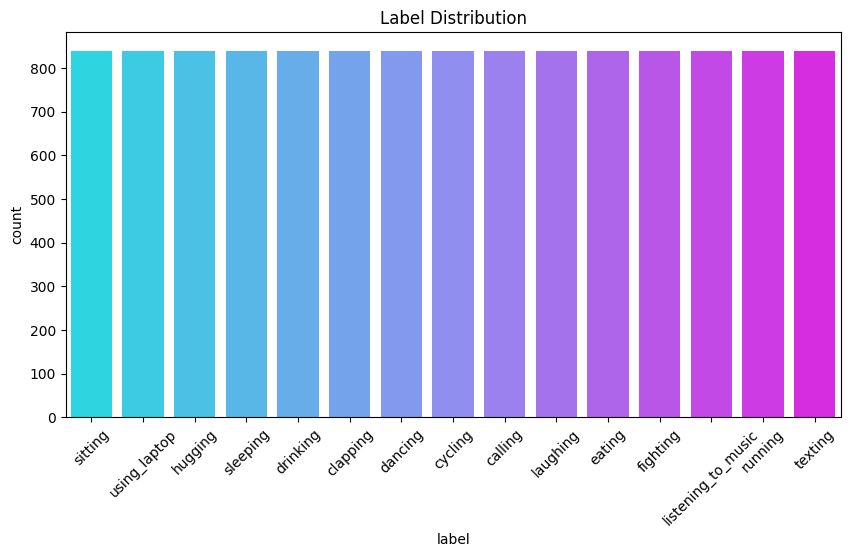

In [ ]:
#Countplot for label
plt.figure(figsize=(10,5))
sns.countplot(x=train_data["label"], palette="cool")
plt.xticks(rotation=45)
plt.title("Label Distribution")
plt.show()


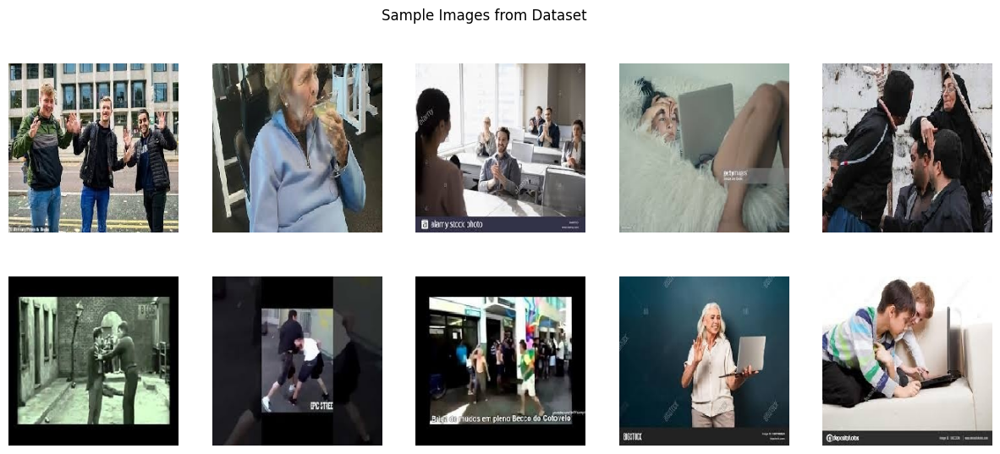

In [ ]:
#Sample images from dataset
fig, axes = plt.subplots(2, 5, figsize=(15, 6))
for i, ax in enumerate(axes.flat):
    img_path = os.path.join(dataset_path, 'train', train_data["filename"][random.randint(0, len(train_data))])
    img = load_img(img_path, target_size=(224, 224))
    ax.imshow(img)
    ax.axis('off')
plt.suptitle("Sample Images from Dataset")
plt.show()


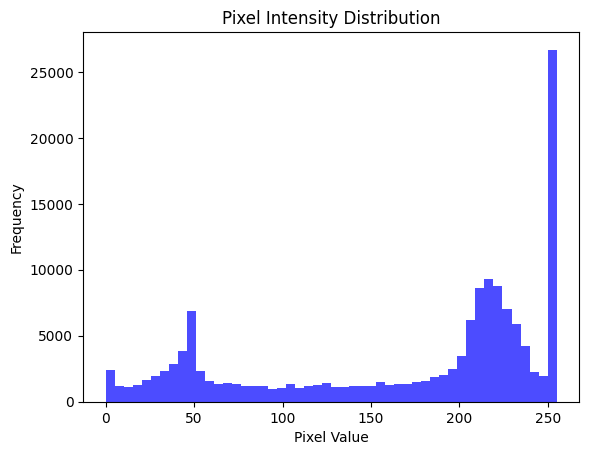

In [ ]:
#Histplot for pixel intensity
img_array = img_to_array(load_img(img_path, target_size=(224,224)))
plt.hist(img_array.ravel(), bins=50, color='blue', alpha=0.7)
plt.title("Pixel Intensity Distribution")
plt.xlabel("Pixel Value")
plt.ylabel("Frequency")
plt.show()


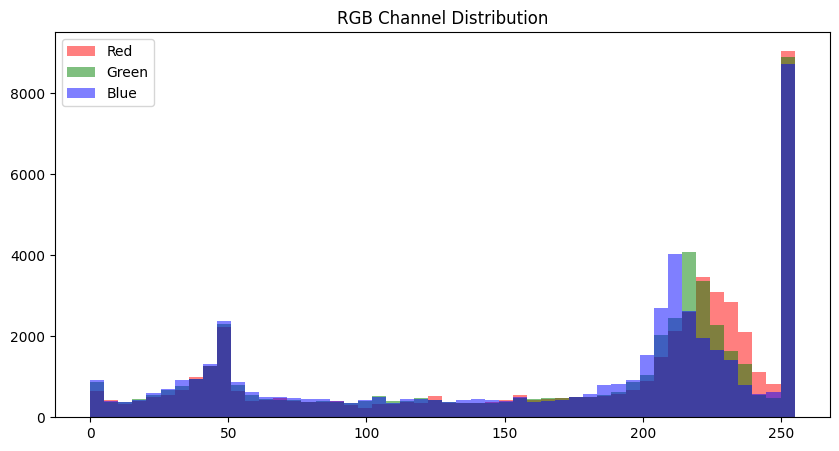

In [ ]:
colors = ['r', 'g', 'b']
labels = ['Red', 'Green', 'Blue']
plt.figure(figsize=(10, 5))
for i in range(3):
    plt.hist(img_array[:, :, i].ravel(), bins=50, color=colors[i], alpha=0.5, label=labels[i])
plt.legend()
plt.title("RGB Channel Distribution")
plt.show()


## **Image Preparation& PreProcessing**

In [ ]:
# Extract filenames and labels
filename = train_data['filename']
labels = train_data['label']

# Prepare image data
img_data = []
img_labels = []
img_size = (160, 160)  # Define image size

for i in range(len(train_fol) - 1):
    img_path = os.path.join(dataset_path, 'train', filename[i])
    img = Image.open(img_path).resize(img_size)
    img_data.append(np.asarray(img))
    img_labels.append(labels[i])

# Convert to numpy array
img_data = np.asarray(img_data)

# One-hot encode labels
y = to_categorical(np.asarray(train_data['label'].factorize()[0]))

print("Image Data Shape:", img_data.shape)
print("Label Data Shape:", y.shape)


Image Data Shape: (12600, 160, 160, 3)
Label Data Shape: (12600, 15)


In [ ]:
# Split dataset into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(img_data, y, test_size=0.2, random_state=42, stratify=y)

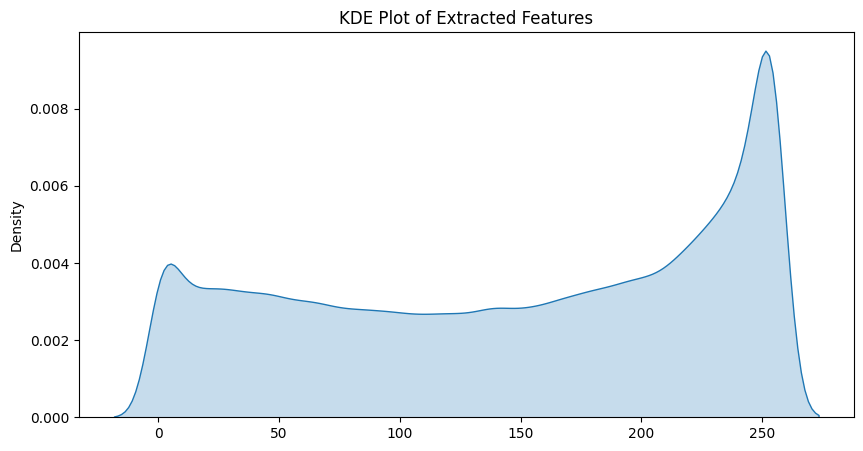

In [ ]:
# Kde plot
sample_features = X_train.reshape(len(X_train), -1)[:, :50]  # Selecting 50 features for visualization
plt.figure(figsize=(10,5))
sns.kdeplot(sample_features.ravel(), fill=True)
plt.title("KDE Plot of Extracted Features")
plt.show()


In [ ]:
# Data Augmentation
datagen = ImageDataGenerator(
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True,
    brightness_range=[0.8, 1.2],
    zoom_range=0.2,
    fill_mode='nearest'
)

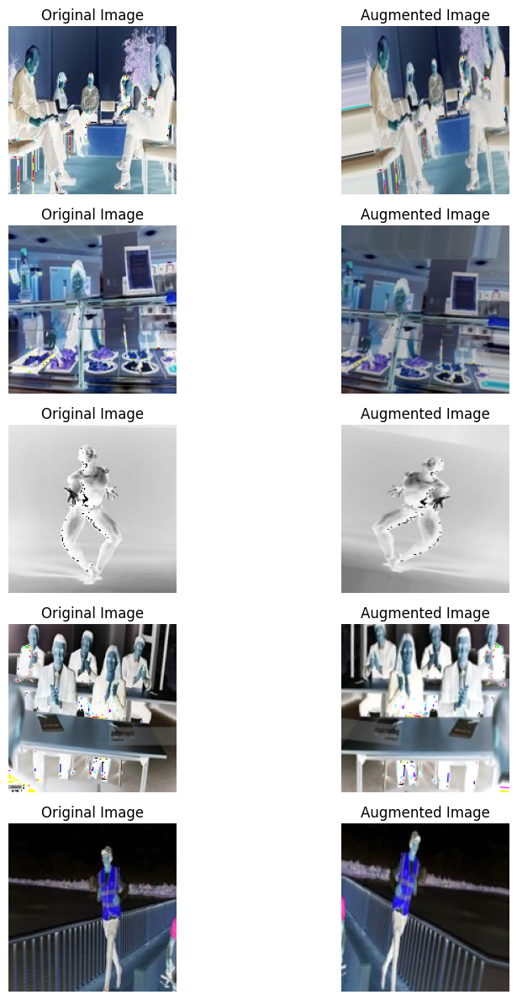

In [ ]:
# Select random images
from PIL import Image
num_samples = 5
random_indices = np.random.choice(len(X_train), num_samples, replace=False)
sample_images = X_train[random_indices]

# Fix: Convert images to uint8 if necessary
sample_images = (sample_images * 255).astype("uint8")

# Generate augmented images using `flow`
augmented_images = []
for img in sample_images:
    img = img.reshape((1,) + img.shape)  # Add batch dimension
    augmented_img = next(datagen.flow(img, batch_size=1))[0]  # Get augmented image
    augmented_images.append(augmented_img)

augmented_images = np.array(augmented_images).astype("uint8")  # Convert to uint8

# Plot Original vs Augmented Images
fig, axes = plt.subplots(num_samples, 2, figsize=(10, 12))

for i in range(num_samples):
    axes[i, 0].imshow(sample_images[i])  # Original Image
    axes[i, 0].set_title("Original Image")
    axes[i, 0].axis("off")

    axes[i, 1].imshow(augmented_images[i])  # Augmented Image
    axes[i, 1].set_title("Augmented Image")
    axes[i, 1].axis("off")

plt.tight_layout()
plt.show()



## **Modeling**

 **Vision Transformer (ViT)** is a transformer-based model designed for image classification tasks.
It splits an image into patches and processes them like tokens in NLP.
ViT achieves high accuracy by capturing global context across the image.

We fine-tune ViT for high-accuracy human action recognition.

In [ ]:
# Load ViT feature extractor for preprocessing images
feature_extractor = ViTFeatureExtractor.from_pretrained("google/vit-base-patch16-224")

# Preprocess input images to match ViT format
def preprocess_images(images):
    return np.array([feature_extractor(image, return_tensors="np")["pixel_values"][0] for image in images])

X_train_preprocessed = preprocess_images(X_train)
X_val_preprocessed = preprocess_images(X_val)

# Load ViT model (Frozen, use as a feature extractor)
vit_base = TFViTModel.from_pretrained("google/vit-base-patch16-224")

# Custom wrapper for ViT model
class ViTFeatureExtractorLayer(Layer):
    def __init__(self, vit_model):
        super(ViTFeatureExtractorLayer, self).__init__()
        self.vit_model = vit_model

    def call(self, inputs):
        return self.vit_model(pixel_values=inputs).last_hidden_state

# Define input shape for ViT (B, 3, 224, 224)
input_vit = Input(shape=(3, 224, 224), name="pixel_values")
vit_features = ViTFeatureExtractorLayer(vit_base)(input_vit)

# Global Pooling + Dense Layers
x = GlobalAveragePooling1D()(vit_features)
x = Dense(256, activation="relu")(x)
x = Dropout(0.5)(x)
output_vit = Dense(y_train.shape[1], activation="softmax")(x)

# Build the ViT model with model_vit name
model_vit = Model(inputs=input_vit, outputs=output_vit)

# Compile the ViT model
model_vit.compile(optimizer=Adam(learning_rate=0.0001), loss="categorical_crossentropy", metrics=["accuracy"])

# Train the ViT model
history_vit = model_vit.fit(
    X_train_preprocessed, y_train,
    validation_data=(X_val_preprocessed, y_val),
    batch_size=16,
    epochs=15,
    verbose=1
)

# Predict with ViT
y_pred_probs_vit = model_vit.predict(X_val_preprocessed)
y_pred_classes_vit = np.argmax(y_pred_probs_vit, axis=1)
y_true_classes_vit = np.argmax(y_val, axis=1)


Some weights of the PyTorch model were not used when initializing the TF 2.0 model TFViTModel: ['classifier.weight', 'classifier.bias']
- This IS expected if you are initializing TFViTModel from a PyTorch model trained on another task or with another architecture (e.g. initializing a TFBertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFViTModel from a PyTorch model that you expect to be exactly identical (e.g. initializing a TFBertForSequenceClassification model from a BertForSequenceClassification model).
Some weights or buffers of the TF 2.0 model TFViTModel were not initialized from the PyTorch model and are newly initialized: ['vit.pooler.dense.weight', 'vit.pooler.dense.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch 1/15
630/630 ━━━━━━━━━━━━━━━━━━━━ 33s 37ms/step - accuracy: 0.3456 - loss: 2.1845 - val_accuracy: 0.7524 - val_loss: 0.8758
Epoch 2/15
630/630 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - accuracy: 0.7085 - loss: 0.9702 - val_accuracy: 0.7849 - val_loss: 0.7102
Epoch 3/15
630/630 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - accuracy: 0.7606 - loss: 0.7772 - val_accuracy: 0.7988 - val_loss: 0.6510
Epoch 4/15
630/630 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - accuracy: 0.7909 - loss: 0.6702 - val_accuracy: 0.8083 - val_loss: 0.6204
Epoch 5/15
630/630 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - accuracy: 0.8092 - loss: 0.6181 - val_accuracy: 0.8083 - val_loss: 0.6038
Epoch 6/15
630/630 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - accuracy: 0.8255 - loss: 0.5566 - val_accuracy: 0.8123 - val_loss: 0.5921
Epoch 7/15
630/630 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - accuracy: 0.8306 - loss: 0.5251 - val_accuracy: 0.8163 - val_loss: 0.5794
Epoch 8/15
630/630 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - accuracy: 0.8411 - loss: 0.4998 - 

Accuracy: 0.8250
Precision: 0.8240
Recall: 0.8250
F1 Score: 0.8234


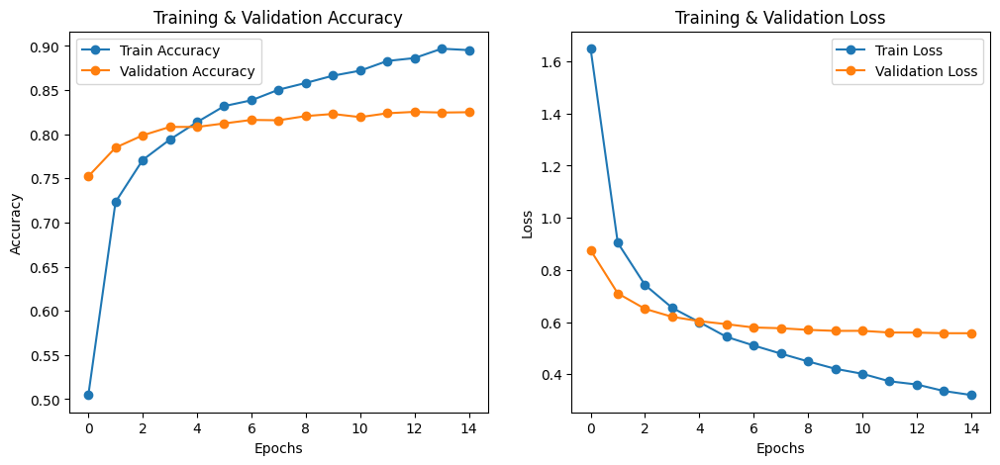

In [ ]:
accuracy = accuracy_score(y_true_classes_vit, y_pred_classes_vit)

# Compute Precision, Recall, and F1 Score
precision = precision_score(y_true_classes_vit, y_pred_classes_vit, average="weighted")
recall = recall_score(y_true_classes_vit, y_pred_classes_vit, average="weighted")
f1 = f1_score(y_true_classes_vit, y_pred_classes_vit, average="weighted")

# Print results
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")

# Plot Accuracy and Loss
plt.figure(figsize=(12, 5))

# Accuracy Plot
plt.subplot(1, 2, 1)
plt.plot(history_vit.history["accuracy"], label="Train Accuracy", marker='o')
plt.plot(history_vit.history["val_accuracy"], label="Validation Accuracy", marker='o')
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.title("Training & Validation Accuracy")
plt.legend()

# Loss Plot
plt.subplot(1, 2, 2)
plt.plot(history_vit.history["loss"], label="Train Loss", marker='o')
plt.plot(history_vit.history["val_loss"], label="Validation Loss", marker='o')
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Training & Validation Loss")
plt.legend()
plt.show()


**Fine-tuning** allows us to unfreeze and retrain parts of a pretrained model. This helps the model adapt better to our dataset and improve accuracy.

In [ ]:
# Unfreeze the entire ViT model for fine-tuning
vit_base.trainable = True

# Recompile with lower LR
model_vit.compile(
    optimizer=Adam(learning_rate=1e-5),
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)


In [ ]:
#  Fine-tune with 10 epochs
fine_tune_vit= model_vit.fit(
    X_train_preprocessed, y_train,
    validation_data=(X_val_preprocessed, y_val),
    batch_size=16,
    epochs=10,
    verbose=1
)


Epoch 1/10
630/630 ━━━━━━━━━━━━━━━━━━━━ 33s 35ms/step - accuracy: 0.9032 - loss: 0.3104 - val_accuracy: 0.8278 - val_loss: 0.5555
Epoch 2/10
630/630 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - accuracy: 0.9056 - loss: 0.3028 - val_accuracy: 0.8302 - val_loss: 0.5544
Epoch 3/10
630/630 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - accuracy: 0.9060 - loss: 0.2970 - val_accuracy: 0.8298 - val_loss: 0.5542
Epoch 4/10
630/630 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - accuracy: 0.9054 - loss: 0.2966 - val_accuracy: 0.8278 - val_loss: 0.5541
Epoch 5/10
630/630 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - accuracy: 0.9065 - loss: 0.2902 - val_accuracy: 0.8302 - val_loss: 0.5538
Epoch 6/10
630/630 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - accuracy: 0.9062 - loss: 0.2970 - val_accuracy: 0.8298 - val_loss: 0.5539
Epoch 7/10
630/630 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - accuracy: 0.9132 - loss: 0.2883 - val_accuracy: 0.8298 - val_loss: 0.5537
Epoch 8/10
630/630 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - accuracy: 0.9109 - loss: 0.2845 - 

In [ ]:
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Predict on validation set
y_pred_probs_vit = model_vit.predict(X_val_preprocessed)
y_pred_classes_vit = np.argmax(y_pred_probs_vit, axis=1)
y_true_classes_vit = np.argmax(y_val, axis=1)

# Compute accuracy
accuracy = accuracy_score(y_true_classes_vit, y_pred_classes_vit)

# Print classification report
print("ViT (Fine-Tuned) Accuracy and Classification Report:\n")
print(f"Accuracy: {accuracy * 100:.2f}%\n")
print("Classification Report:")
print(classification_report(y_true_classes_vit, y_pred_classes_vit, digits=2))


# Extract metrics from fine-tuning history
acc = fine_tune_vit.history['accuracy']
val_acc = fine_tune_vit.history['val_accuracy']
loss = fine_tune_vit.history['loss']
val_loss = fine_tune_vit.history['val_loss']






79/79 ━━━━━━━━━━━━━━━━━━━━ 11s 93ms/step
ViT (Fine-Tuned) Accuracy and Classification Report:

Accuracy: 82.98%

Classification Report:
              precision    recall  f1-score   support

           0       0.66      0.74      0.70       168
           1       0.79      0.83      0.81       168
           2       0.82      0.87      0.84       168
           3       0.88      0.86      0.87       168
           4       0.90      0.83      0.86       168
           5       0.83      0.86      0.85       168
           6       0.87      0.89      0.88       168
           7       0.97      0.98      0.98       168
           8       0.73      0.77      0.75       168
           9       0.84      0.80      0.82       168
          10       0.92      0.94      0.93       168
          11       0.86      0.89      0.87       168
          12       0.80      0.62      0.70       168
          13       0.90      0.92      0.91       168
          14       0.69      0.65      0.67       168

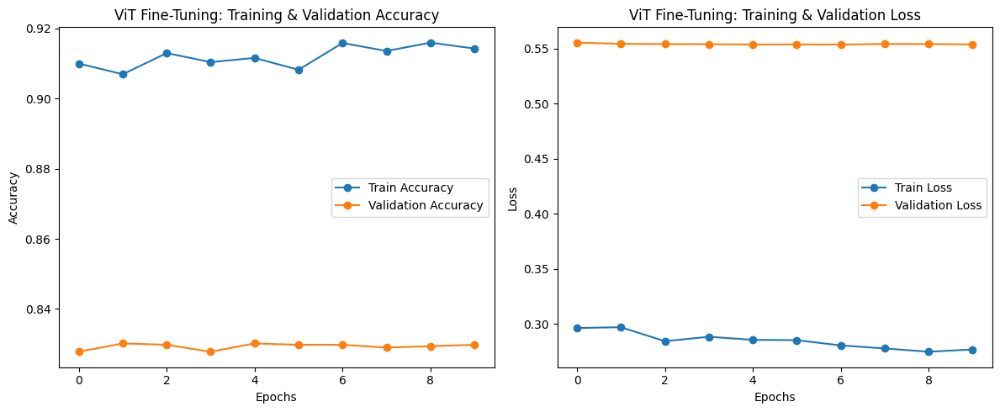

In [ ]:

# Plot Accuracy and Loss
plt.figure(figsize=(12, 5))
# Accuracy
plt.subplot(1, 2, 1)
plt.plot(acc, label='Train Accuracy', marker='o')
plt.plot(val_acc, label='Validation Accuracy', marker='o')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('ViT Fine-Tuning: Training & Validation Accuracy')
plt.legend()

# Loss
plt.subplot(1, 2, 2)
plt.plot(loss, label='Train Loss', marker='o')
plt.plot(val_loss, label='Validation Loss', marker='o')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('ViT Fine-Tuning: Training & Validation Loss')
plt.legend()

plt.tight_layout()
plt.show()



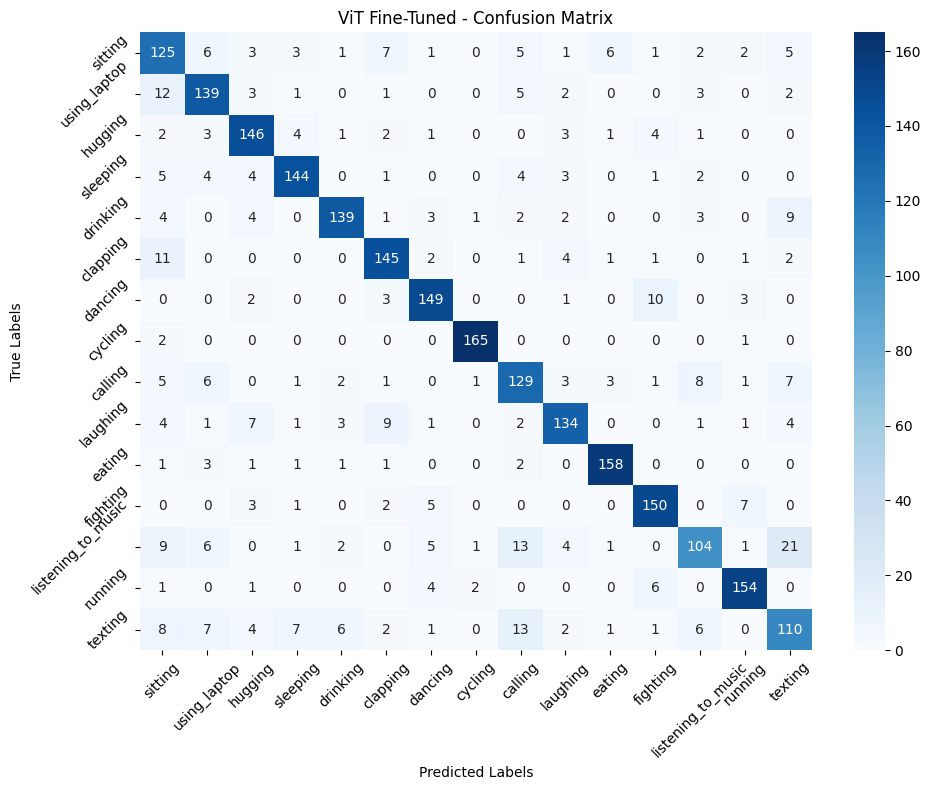

In [ ]:
# Confusion matrix
class_names = [
    "sitting", "using_laptop", "hugging", "sleeping", "drinking",
    "clapping", "dancing", "cycling", "calling", "laughing",
    "eating", "fighting", "listening_to_music", "running", "texting"
]
conf_matrix = confusion_matrix(y_true_classes_vit, y_pred_classes_vit)

# Plot confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names)
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("ViT Fine-Tuned - Confusion Matrix")
plt.xticks(rotation=45)
plt.yticks(rotation=45)
plt.tight_layout()
plt.show()


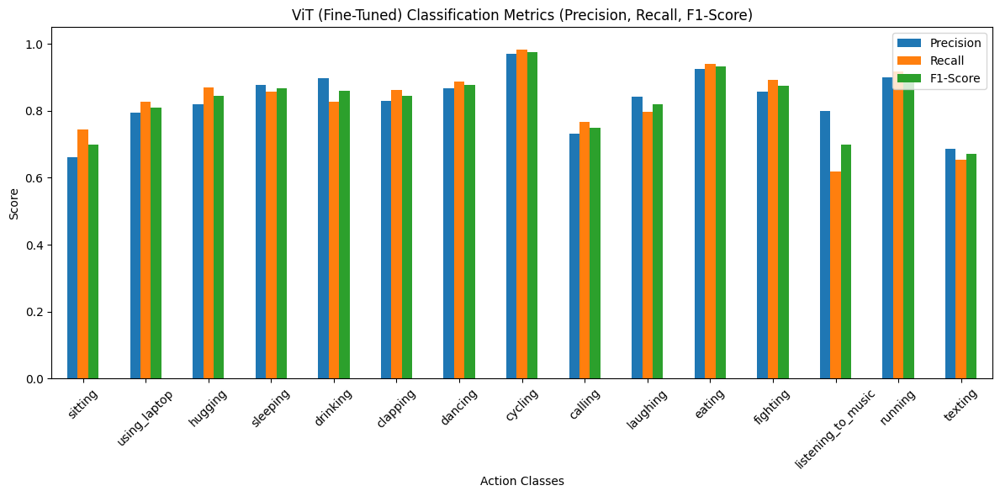

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report

# Define class names (same order as one-hot encoding)
target_classes = [
    "sitting", "using_laptop", "hugging", "sleeping", "drinking",
    "clapping", "dancing", "cycling", "calling", "laughing",
    "eating", "fighting", "listening_to_music", "running", "texting"
]

# Generate classification report
report = classification_report(
    y_true_classes_vit,
    y_pred_classes_vit,
    target_names=target_classes,
    output_dict=True
)

# Extract metrics
precision = [report[class_name]['precision'] for class_name in target_classes]
recall = [report[class_name]['recall'] for class_name in target_classes]
f1 = [report[class_name]['f1-score'] for class_name in target_classes]

# Create DataFrame for plotting
metrics = np.array([precision, recall, f1]).T
metrics_df = pd.DataFrame(metrics, columns=['Precision', 'Recall', 'F1-Score'], index=target_classes)

# Plot
metrics_df.plot(kind='bar', figsize=(12, 6))
plt.title('ViT (Fine-Tuned) Classification Metrics (Precision, Recall, F1-Score)')
plt.ylabel('Score')
plt.xlabel('Action Classes')
plt.xticks(rotation=45)
plt.ylim(0, 1.05)
plt.legend(loc='upper right')
plt.tight_layout()
plt.show()


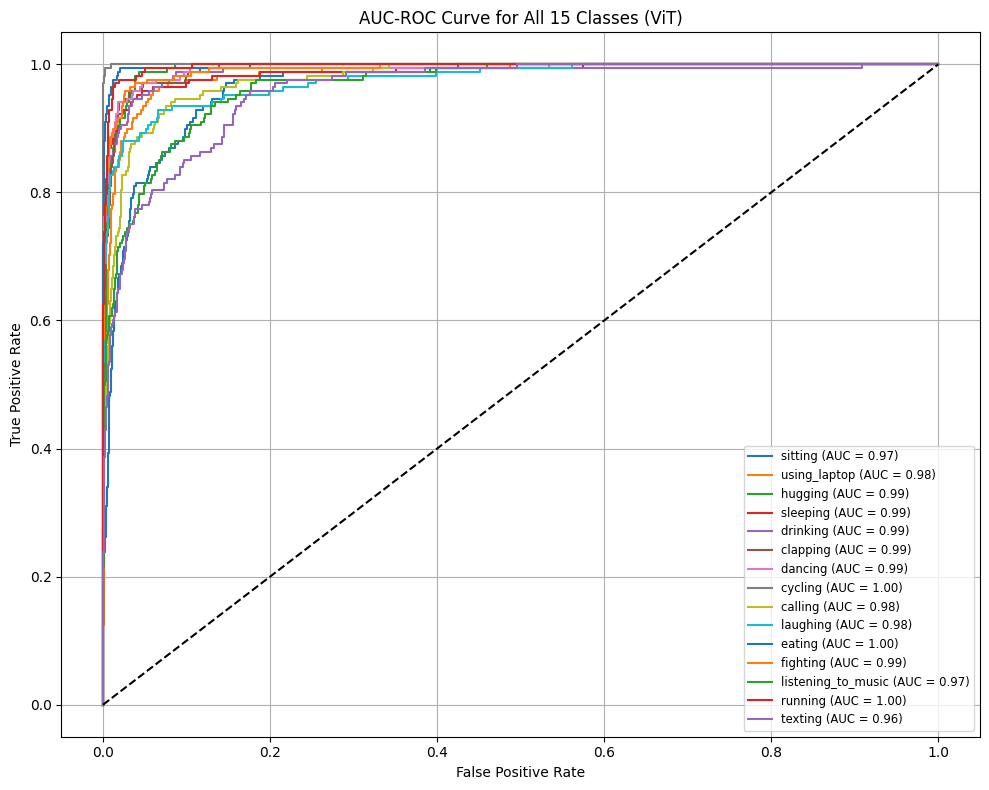

In [ ]:
# finding AOC-ROC for 15 classes to see limitation of each class
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 8))
for i in range(y_val.shape[1]):
    fpr, tpr, _ = roc_curve(y_val[:, i], y_pred_probs_vit[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f"{class_names[i]} (AUC = {roc_auc:.2f})")

plt.plot([0, 1], [0, 1], 'k--')
plt.title("AUC-ROC Curve for All 15 Classes (ViT)")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend(loc="lower right", fontsize='small')
plt.grid(True)
plt.tight_layout()
plt.show()



In [ ]:
# Saving the VIT
model_vit.save_weights("/content/drive/MyDrive/HAR_MODEL_SAVE/vit_finetuned_HAR.weights.h5")



**MobileNetV2** is a pretrained CNN model optimized for speed and efficiency and  implemented using  lightweight convolutional neural network (CNN) model.

In [ ]:
#Building MobileNet V2
import tensorflow as tf
import numpy as np
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, Dropout, GlobalAveragePooling2D
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Set seed
tf.random.set_seed(42)

# Preprocessing
def preprocess_images(image, label):
    image = tf.image.resize(image, (224, 224))
    image = preprocess_input(image)
    return image, label

BATCH_SIZE = 16
AUTOTUNE = tf.data.AUTOTUNE

train_dataset = tf.data.Dataset.from_tensor_slices((X_train, y_train))
train_dataset = train_dataset.map(preprocess_images, num_parallel_calls=AUTOTUNE).shuffle(1000).batch(BATCH_SIZE).prefetch(AUTOTUNE)

val_dataset = tf.data.Dataset.from_tensor_slices((X_val, y_val))
val_dataset = val_dataset.map(preprocess_images, num_parallel_calls=AUTOTUNE).batch(BATCH_SIZE).prefetch(AUTOTUNE)

# Build Model
base_model = MobileNetV2(input_shape=(224, 224, 3), include_top=False, weights='imagenet')
base_model.trainable = False

input_layer = Input(shape=(224, 224, 3), name="input_image")
x = base_model(input_layer, training=False)
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation="relu")(x)
x = Dropout(0.5)(x)
output_layer = Dense(y_train.shape[1], activation="softmax")(x)
model_mobilenet = Model(inputs=input_layer, outputs=output_layer)

model_mobilenet.compile(
    optimizer=Adam(learning_rate=0.0001),
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)

#train saveing  for plotting
history_mobilenet = model_mobilenet.fit(
    train_dataset,
    validation_data=val_dataset,
    epochs=15,
    verbose=1
)


Epoch 1/15
630/630 ━━━━━━━━━━━━━━━━━━━━ 20s 19ms/step - accuracy: 0.2372 - loss: 2.4607 - val_accuracy: 0.5825 - val_loss: 1.3959
Epoch 2/15
630/630 ━━━━━━━━━━━━━━━━━━━━ 7s 12ms/step - accuracy: 0.5098 - loss: 1.5328 - val_accuracy: 0.6111 - val_loss: 1.2181
Epoch 3/15
630/630 ━━━━━━━━━━━━━━━━━━━━ 7s 11ms/step - accuracy: 0.5811 - loss: 1.3234 - val_accuracy: 0.6230 - val_loss: 1.1391
Epoch 4/15
630/630 ━━━━━━━━━━━━━━━━━━━━ 7s 11ms/step - accuracy: 0.6246 - loss: 1.1921 - val_accuracy: 0.6421 - val_loss: 1.0963
Epoch 5/15
630/630 ━━━━━━━━━━━━━━━━━━━━ 7s 11ms/step - accuracy: 0.6506 - loss: 1.1084 - val_accuracy: 0.6508 - val_loss: 1.0649
Epoch 6/15
630/630 ━━━━━━━━━━━━━━━━━━━━ 7s 11ms/step - accuracy: 0.6703 - loss: 1.0477 - val_accuracy: 0.6567 - val_loss: 1.0389
Epoch 7/15
630/630 ━━━━━━━━━━━━━━━━━━━━ 7s 11ms/step - accuracy: 0.6811 - loss: 0.9897 - val_accuracy: 0.6671 - val_loss: 1.0151
Epoch 8/15
630/630 ━━━━━━━━━━━━━━━━━━━━ 7s 11ms/step - accuracy: 0.7022 - loss: 0.9386 - val_acc

158/158 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step
 MobileNetV2 Final Evaluation Metrics:
Accuracy  : 0.6778
Precision : 0.6782
Recall    : 0.6778
F1 Score  : 0.6757


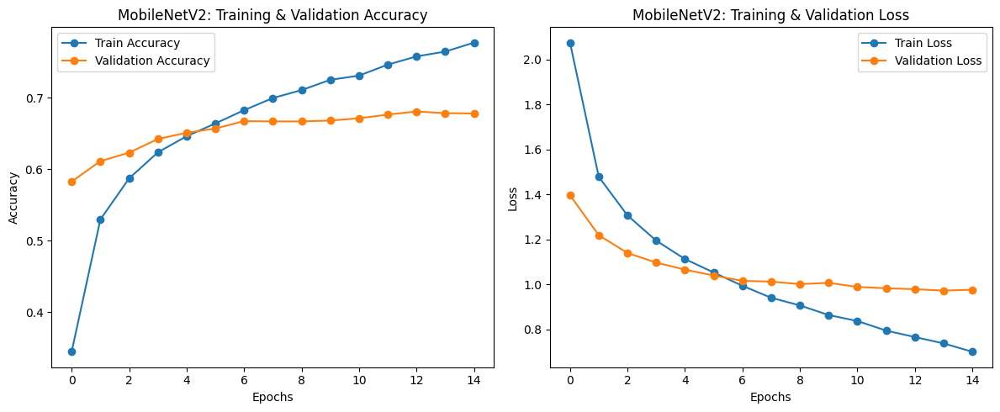

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
import numpy as np
import matplotlib.pyplot as plt

# Predict using the final MobileNetV2 model
y_pred_probs_mobilenet = model_mobilenet.predict(val_dataset)
y_pred_classes_mobilenet = np.argmax(y_pred_probs_mobilenet, axis=1)
y_true_classes_mobilenet = np.argmax(y_val, axis=1)  # Assumes y_val is one-hot encoded

# Compute evaluation metrics
accuracy = accuracy_score(y_true_classes_mobilenet, y_pred_classes_mobilenet)
precision = precision_score(y_true_classes_mobilenet, y_pred_classes_mobilenet, average='weighted')
recall = recall_score(y_true_classes_mobilenet, y_pred_classes_mobilenet, average='weighted')
f1 = f1_score(y_true_classes_mobilenet, y_pred_classes_mobilenet, average='weighted')

# Print final scores
print(" MobileNetV2 Final Evaluation Metrics:")
print(f"Accuracy  : {accuracy:.4f}")
print(f"Precision : {precision:.4f}")
print(f"Recall    : {recall:.4f}")
print(f"F1 Score  : {f1:.4f}")

# Plot Accuracy and Loss Curves
plt.figure(figsize=(12, 5))

# Accuracy Plot
plt.subplot(1, 2, 1)
plt.plot(history_mobilenet.history['accuracy'], label='Train Accuracy', marker='o')
plt.plot(history_mobilenet.history['val_accuracy'], label='Validation Accuracy', marker='o')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('MobileNetV2: Training & Validation Accuracy')
plt.legend()

# Loss Plot
plt.subplot(1, 2, 2)
plt.plot(history_mobilenet.history['loss'], label='Train Loss', marker='o')
plt.plot(history_mobilenet.history['val_loss'], label='Validation Loss', marker='o')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('MobileNetV2: Training & Validation Loss')
plt.legend()

plt.tight_layout()
plt.show()


In [ ]:
# Fine Tuning MobileNetV2

# Unfreeze last 50 layers of the base model
for layer in base_model.layers[:-50]:
    layer.trainable = False
for layer in base_model.layers[-50:]:
    layer.trainable = True

# Recompile with a lower learning rate
model_mobilenet.compile(
    optimizer=Adam(learning_rate=1e-5),
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)

# Save fine-tuning history
fine_tune_history = model_mobilenet.fit(
    train_dataset,
    validation_data=val_dataset,
    epochs=10,
    verbose=1
)


Epoch 1/10
630/630 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - accuracy: 0.5639 - loss: 1.3422 - val_accuracy: 0.6746 - val_loss: 1.0033
Epoch 2/10
630/630 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step - accuracy: 0.6700 - loss: 1.0326 - val_accuracy: 0.6861 - val_loss: 0.9997
Epoch 3/10
630/630 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step - accuracy: 0.7139 - loss: 0.9127 - val_accuracy: 0.6889 - val_loss: 0.9795
Epoch 4/10
630/630 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step - accuracy: 0.7350 - loss: 0.8238 - val_accuracy: 0.6909 - val_loss: 0.9699
Epoch 5/10
630/630 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step - accuracy: 0.7573 - loss: 0.7539 - val_accuracy: 0.6968 - val_loss: 0.9535
Epoch 6/10
630/630 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step - accuracy: 0.7733 - loss: 0.7027 - val_accuracy: 0.7032 - val_loss: 0.9303
Epoch 7/10
630/630 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step - accuracy: 0.7907 - loss: 0.6443 - val_accuracy: 0.7056 - val_loss: 0.9227
Epoch 8/10
630/630 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step - accuracy: 0.8150 - loss: 0.5745 - val_acc

In [ ]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Predict using fine-tuned MobileNetV2
y_pred_probs_finetuned = model_mobilenet.predict(val_dataset)
y_pred_classes_finetuned = np.argmax(y_pred_probs_finetuned, axis=1)
y_true_classes_finetuned = np.argmax(y_val, axis=1)  # Assumes one-hot encoded y_val

# compute accuracy
accuracy = accuracy_score(y_true_classes_finetuned, y_pred_classes_finetuned)

# Classification Report
print("MobileNetV2 (Fine-Tuned) Accuracy and Classification Report:\n")
print(f"Accuracy: {accuracy * 100:.2f}%\n")
print("Classification Report:")
print(classification_report(y_true_classes_finetuned, y_pred_classes_finetuned, digits=2))



158/158 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step
MobileNetV2 (Fine-Tuned) Accuracy and Classification Report:

Accuracy: 71.67%

Classification Report:
              precision    recall  f1-score   support

           0       0.54      0.54      0.54       168
           1       0.72      0.65      0.69       168
           2       0.70      0.71      0.71       168
           3       0.81      0.83      0.82       168
           4       0.75      0.65      0.70       168
           5       0.66      0.79      0.72       168
           6       0.72      0.80      0.76       168
           7       0.96      0.98      0.97       168
           8       0.60      0.67      0.63       168
           9       0.72      0.69      0.70       168
          10       0.85      0.89      0.87       168
          11       0.71      0.74      0.73       168
          12       0.58      0.51      0.54       168
          13       0.85      0.76      0.80       168
          14       0.58      0.51      0.54  

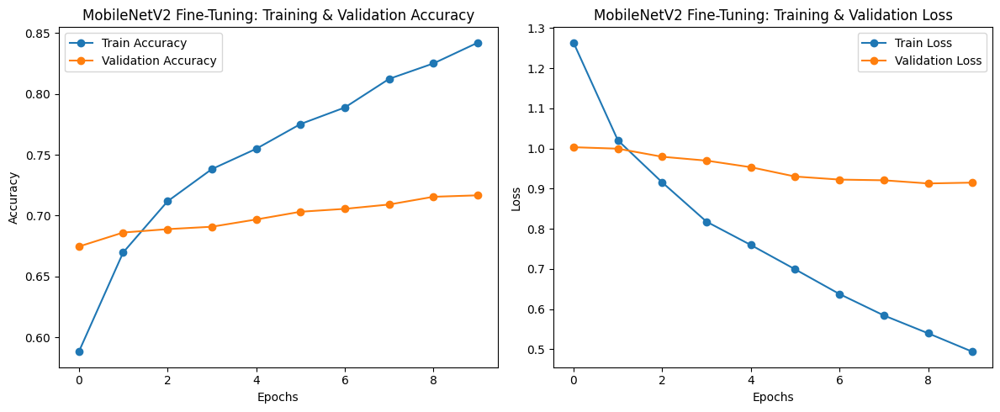

In [ ]:
# Accuracy & Loss Curve Fine-Tune plotting

plt.figure(figsize=(12, 5))

# Accuracy
plt.subplot(1, 2, 1)
plt.plot(fine_tune_history.history['accuracy'], label='Train Accuracy', marker='o')
plt.plot(fine_tune_history.history['val_accuracy'], label='Validation Accuracy', marker='o')
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.title("MobileNetV2 Fine-Tuning: Training & Validation Accuracy")
plt.legend()

# Loss
plt.subplot(1, 2, 2)
plt.plot(fine_tune_history.history['loss'], label='Train Loss', marker='o')
plt.plot(fine_tune_history.history['val_loss'], label='Validation Loss', marker='o')
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("MobileNetV2 Fine-Tuning: Training & Validation Loss")
plt.legend()

plt.tight_layout()
plt.show()

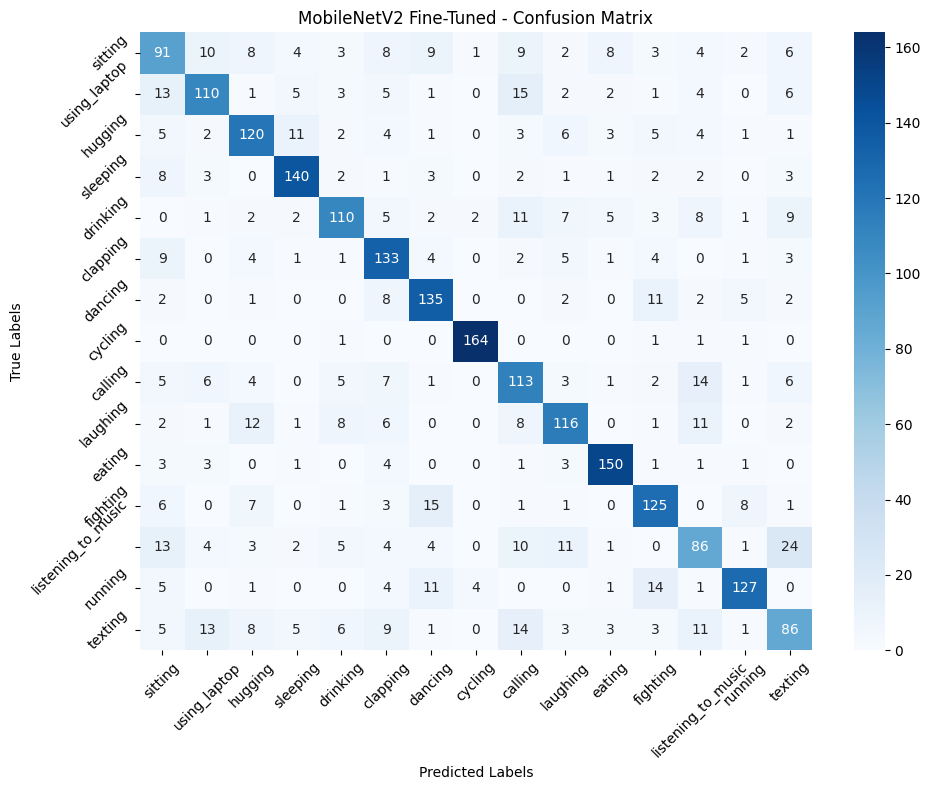

In [ ]:

# confusion matrix
class_names = [
    "sitting", "using_laptop", "hugging", "sleeping", "drinking",
    "clapping", "dancing", "cycling", "calling", "laughing",
    "eating", "fighting", "listening_to_music", "running", "texting"
]

conf_matrix = confusion_matrix(y_true_classes_finetuned, y_pred_classes_finetuned)

plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names)
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("MobileNetV2 Fine-Tuned - Confusion Matrix")
plt.xticks(rotation=45)
plt.yticks(rotation=45)
plt.tight_layout()
plt.show()




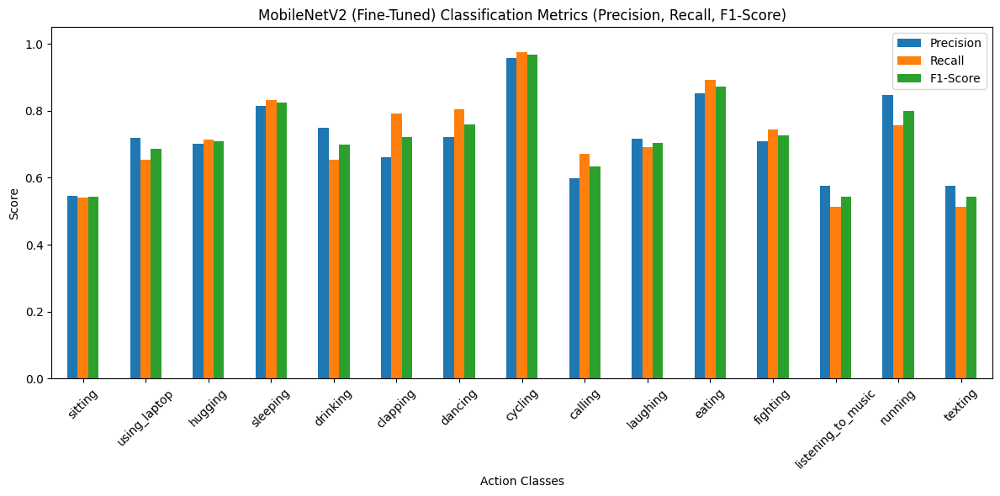

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report

# Define class names
target_classes = [
    "sitting", "using_laptop", "hugging", "sleeping", "drinking",
    "clapping", "dancing", "cycling", "calling", "laughing",
    "eating", "fighting", "listening_to_music", "running", "texting"
]

# Generate classification report
report = classification_report(
    y_true_classes_finetuned,
    y_pred_classes_finetuned,
    target_names=target_classes,
    output_dict=True
)

# Extract precision, recall, F1-score
precision = [report[cls]["precision"] for cls in target_classes]
recall = [report[cls]["recall"] for cls in target_classes]
f1 = [report[cls]["f1-score"] for cls in target_classes]

# Create DataFrame
metrics = np.array([precision, recall, f1]).T
metrics_df = pd.DataFrame(metrics, columns=["Precision", "Recall", "F1-Score"], index=target_classes)

# Plotting the grouped bar chart
metrics_df.plot(kind='bar', figsize=(12, 6))
plt.title("MobileNetV2 (Fine-Tuned) Classification Metrics (Precision, Recall, F1-Score)")
plt.ylabel("Score")
plt.xlabel("Action Classes")
plt.xticks(rotation=45)
plt.ylim(0, 1.05)
plt.legend(loc='upper right')
plt.tight_layout()
plt.show()


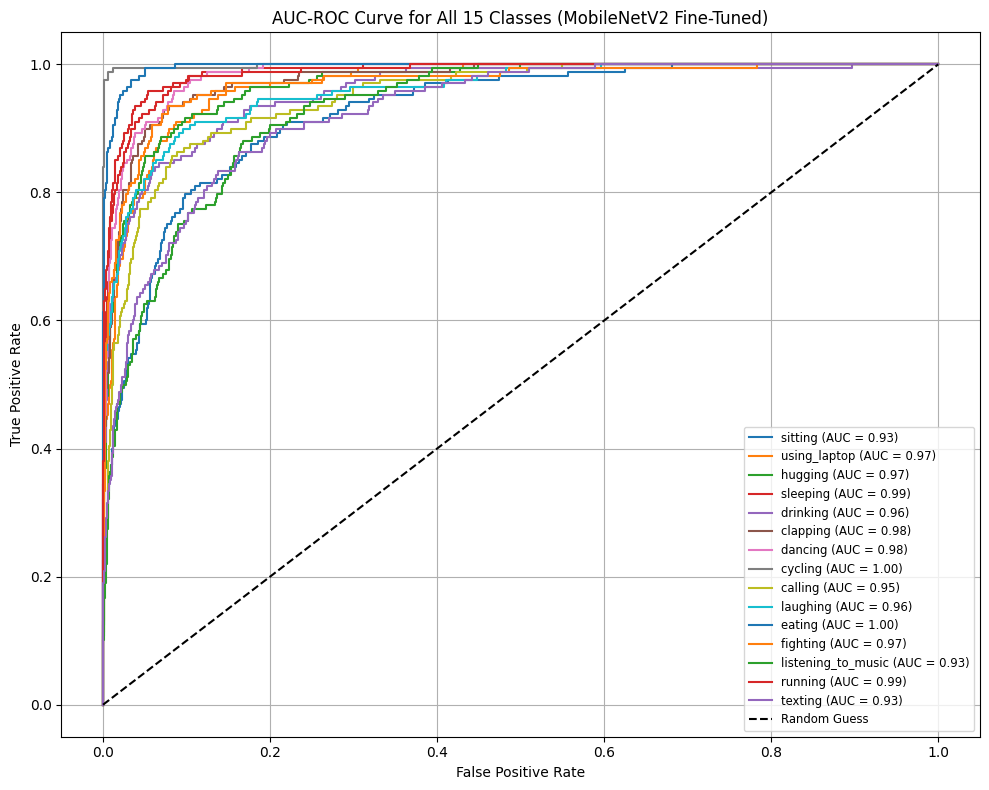

In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt


plt.figure(figsize=(10, 8))

# Plot AUC for each class
for i in range(y_val.shape[1]):
    fpr, tpr, _ = roc_curve(y_val[:, i], y_pred_probs_finetuned[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f"{class_names[i]} (AUC = {roc_auc:.2f})")

# Diagonal reference line
plt.plot([0, 1], [0, 1], 'k--', label="Random Guess")

# Labels and Title
plt.title("AUC-ROC Curve for All 15 Classes (MobileNetV2 Fine-Tuned)")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend(loc="lower right", fontsize='small')
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
#Save mobilenetv2
model_mobilenet.save_weights("/content/drive/MyDrive/HAR_MODEL_SAVE/mobilenetv2_finetuned.weights.h5")


**ResNet50** is a pretrained deep convolutional neural network known for its residual (skip) connections.
These connections help prevent vanishing gradients during training.


In [ ]:
#Building ResNet50
import tensorflow as tf
import numpy as np
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications.resnet50 import preprocess_input
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, Dropout, GlobalAveragePooling2D
from tensorflow.keras.optimizers import Adam

# Set seed
tf.random.set_seed(42)

# Parameters
IMG_SIZE = (224, 224)
BATCH_SIZE = 16
EPOCHS = 15

# Correct preprocessing function
def preprocess(image, label):
    image = tf.image.resize(image, IMG_SIZE)
    image = preprocess_input(image)  # ResNet50-specific normalization
    return image, label

# tf.data pipeline
train_dataset = tf.data.Dataset.from_tensor_slices((X_train, y_train)).map(preprocess).shuffle(1000).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)
val_dataset = tf.data.Dataset.from_tensor_slices((X_val, y_val)).map(preprocess).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)

# Load base model
base_model = ResNet50(input_shape=(224, 224, 3), include_top=False, weights='imagenet')
base_model.trainable = False

# Custom classification head
input_layer = Input(shape=(224, 224, 3), name="input_image")
x = base_model(input_layer, training=False)
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation="relu")(x)
x = Dropout(0.5)(x)
output_layer = Dense(y_train.shape[1], activation="softmax")(x)

model_Resnet= Model(inputs=input_layer, outputs=output_layer)

# Compile
model_Resnet.compile(optimizer=Adam(learning_rate=1e-4),
              loss="categorical_crossentropy",
              metrics=["accuracy"])

# Train
history = model_Resnet.fit(train_dataset, validation_data=val_dataset, epochs=EPOCHS, verbose=1)

# Evaluate
y_pred_probs = model_Resnet.predict(val_dataset)
y_pred_classes = np.argmax(y_pred_probs, axis=1)
y_true_classes = np.argmax(y_val, axis=1)


Epoch 1/15
630/630 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - accuracy: 0.2976 - loss: 2.2839 - val_accuracy: 0.6111 - val_loss: 1.2620
Epoch 2/15
630/630 ━━━━━━━━━━━━━━━━━━━━ 11s 18ms/step - accuracy: 0.5627 - loss: 1.3828 - val_accuracy: 0.6492 - val_loss: 1.0997
Epoch 3/15
630/630 ━━━━━━━━━━━━━━━━━━━━ 11s 17ms/step - accuracy: 0.6257 - loss: 1.1792 - val_accuracy: 0.6667 - val_loss: 1.0357
Epoch 4/15
630/630 ━━━━━━━━━━━━━━━━━━━━ 11s 17ms/step - accuracy: 0.6719 - loss: 1.0381 - val_accuracy: 0.6786 - val_loss: 1.0074
Epoch 5/15
630/630 ━━━━━━━━━━━━━━━━━━━━ 11s 18ms/step - accuracy: 0.6925 - loss: 0.9665 - val_accuracy: 0.6829 - val_loss: 0.9632
Epoch 6/15
630/630 ━━━━━━━━━━━━━━━━━━━━ 11s 18ms/step - accuracy: 0.7221 - loss: 0.8819 - val_accuracy: 0.6841 - val_loss: 0.9525
Epoch 7/15
630/630 ━━━━━━━━━━━━━━━━━━━━ 11s 17ms/step - accuracy: 0.7461 - loss: 0.8165 - val_accuracy: 0.7000 - val_loss: 0.9288
Epoch 8/15
630/630 ━━━━━━━━━━━━━━━━━━━━ 11s 18ms/step - accuracy: 0.7502 - loss: 0.7747 - 

Resnet50 Evalution matrics 
Accuracy  : 0.7087
Precision : 0.7151
Recall    : 0.7087
F1 Score  : 0.7086


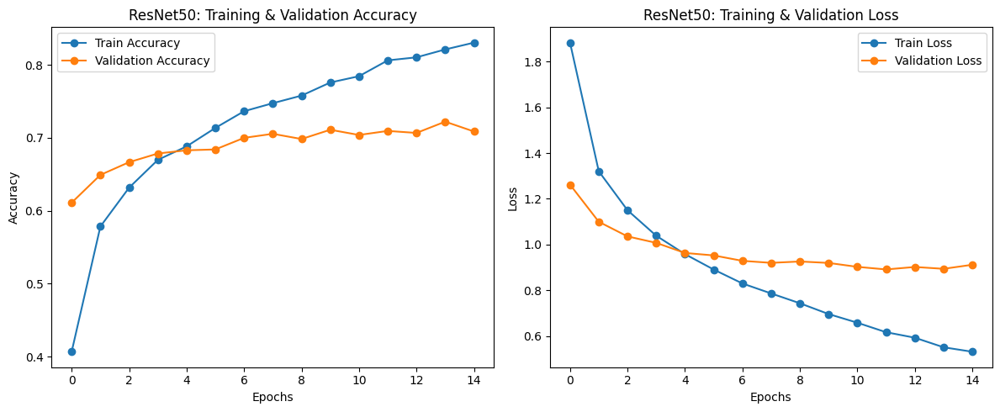

In [ ]:

#Compute metrics
accuracy = accuracy_score(y_true_classes, y_pred_classes)
precision = precision_score(y_true_classes, y_pred_classes, average='weighted')
recall = recall_score(y_true_classes, y_pred_classes, average='weighted')
f1 = f1_score(y_true_classes, y_pred_classes, average='weighted')

# Print scores
print("Resnet50 Evalution matrics ")
print(f"Accuracy  : {accuracy:.4f}")
print(f"Precision : {precision:.4f}")
print(f"Recall    : {recall:.4f}")
print(f"F1 Score  : {f1:.4f}")
# Training and Validation Accuracy & Loss
plt.figure(figsize=(12, 5))

# Accuracy plot
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy', marker='o')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy', marker='o')
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.title("ResNet50: Training & Validation Accuracy")
plt.legend()

# Loss plot
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss', marker='o')
plt.plot(history.history['val_loss'], label='Validation Loss', marker='o')
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("ResNet50: Training & Validation Loss")
plt.legend()

plt.tight_layout()
plt.show()


In [ ]:
base_model.trainable = True

# Recompile with lower LR
model_Resnet.compile(optimizer=Adam(1e-5), loss="categorical_crossentropy", metrics=["accuracy"])

# Fine-tune
fine_tune_Resnet= model_Resnet.fit(train_dataset, validation_data=val_dataset, epochs=5, verbose=1)


Epoch 1/5
630/630 ━━━━━━━━━━━━━━━━━━━━ 91s 50ms/step - accuracy: 0.6872 - loss: 0.9674 - val_accuracy: 0.7258 - val_loss: 0.8668
Epoch 2/5
630/630 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - accuracy: 0.8326 - loss: 0.5475 - val_accuracy: 0.7413 - val_loss: 0.8307
Epoch 3/5
630/630 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - accuracy: 0.8828 - loss: 0.3818 - val_accuracy: 0.7504 - val_loss: 0.8214
Epoch 4/5
630/630 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - accuracy: 0.9162 - loss: 0.2749 - val_accuracy: 0.7591 - val_loss: 0.8370
Epoch 5/5
630/630 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step - accuracy: 0.9426 - loss: 0.2087 - val_accuracy: 0.7540 - val_loss: 0.8628


158/158 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step
ResNet50 (Fine-Tuned) Accuracy and Classification Report:

Accuracy: 75.40%

Classification Report:
              precision    recall  f1-score   support

           0       0.57      0.62      0.60       168
           1       0.78      0.74      0.76       168
           2       0.68      0.77      0.72       168
           3       0.84      0.86      0.85       168
           4       0.81      0.68      0.74       168
           5       0.76      0.77      0.77       168
           6       0.81      0.76      0.79       168
           7       0.96      0.99      0.97       168
           8       0.60      0.65      0.62       168
           9       0.80      0.76      0.78       168
          10       0.90      0.88      0.89       168
          11       0.79      0.80      0.80       168
          12       0.60      0.61      0.60       168
          13       0.80      0.85      0.82       168
          14       0.64      0.58      0.61   

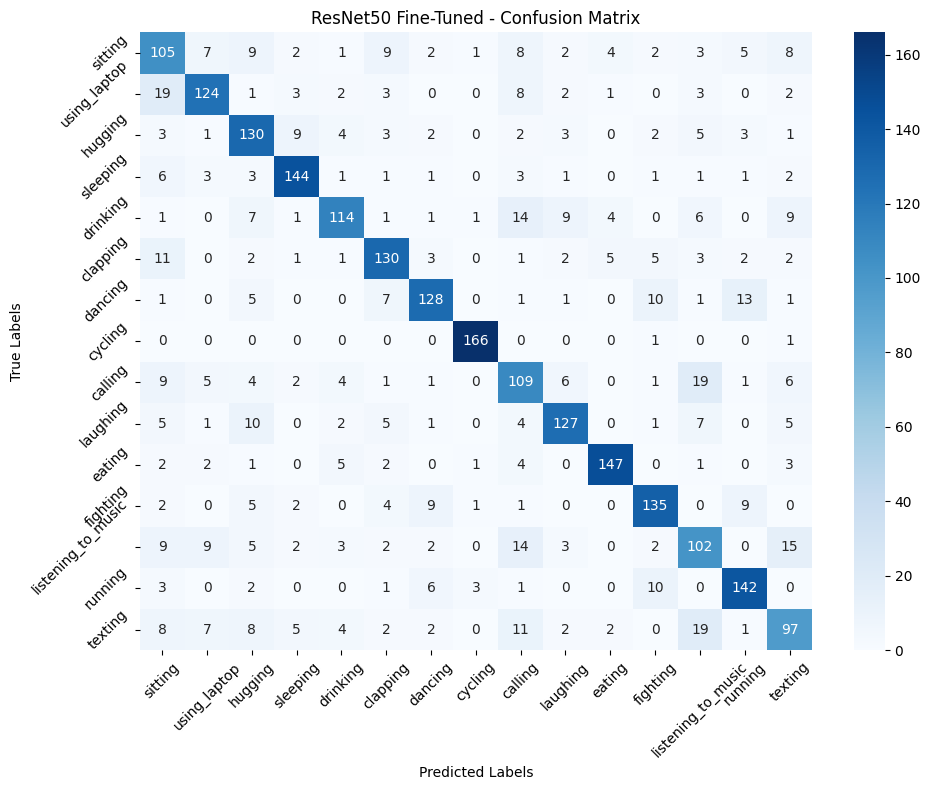

In [ ]:
#  Predict using fine-tuned ResNet50
y_pred_probs_resnet = model_Resnet.predict(val_dataset)
y_pred_classes_resnet = np.argmax(y_pred_probs_resnet, axis=1)
y_true_classes_resnet = np.argmax(y_val, axis=1)  # y_val is one-hot encoded

# Compute accuracy
accuracy = accuracy_score(y_true_classes_resnet, y_pred_classes_resnet)

# Print classification report
print("ResNet50 (Fine-Tuned) Accuracy and Classification Report:\n")
print(f"Accuracy: {accuracy * 100:.2f}%\n")
print("Classification Report:")
print(classification_report(y_true_classes_resnet, y_pred_classes_resnet, digits=2))

# Confusion Matrix
class_names = [
    "sitting", "using_laptop", "hugging", "sleeping", "drinking",
    "clapping", "dancing", "cycling", "calling", "laughing",
    "eating", "fighting", "listening_to_music", "running", "texting"
]

conf_matrix = confusion_matrix(y_true_classes_resnet, y_pred_classes_resnet)

plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names)
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("ResNet50 Fine-Tuned - Confusion Matrix")
plt.xticks(rotation=45)
plt.yticks(rotation=45)
plt.tight_layout()
plt.show()




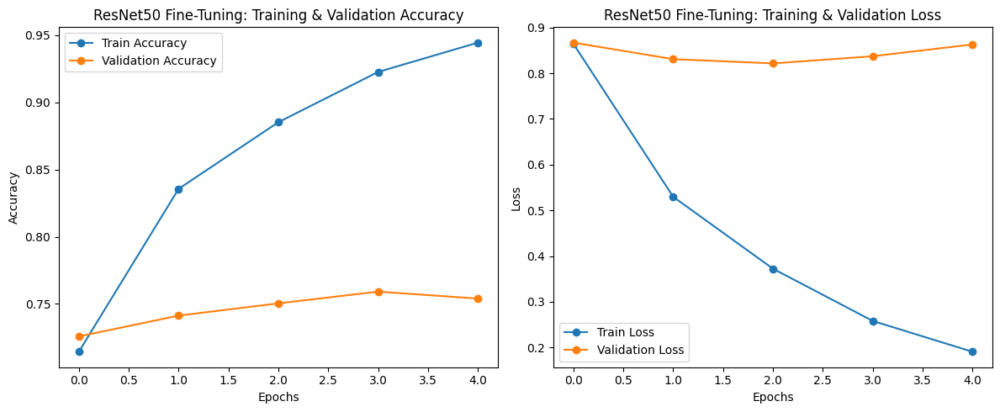

In [ ]:
# Training & Validation Accuracy and Loss
plt.figure(figsize=(12, 5))

# Accuracy plot
plt.subplot(1, 2, 1)
plt.plot(fine_tune_Resnet.history['accuracy'], label='Train Accuracy', marker='o')
plt.plot(fine_tune_Resnet.history['val_accuracy'], label='Validation Accuracy', marker='o')
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.title("ResNet50 Fine-Tuning: Training & Validation Accuracy")
plt.legend()

# Loss plot
plt.subplot(1, 2, 2)
plt.plot(fine_tune_Resnet.history['loss'], label='Train Loss', marker='o')
plt.plot(fine_tune_Resnet.history['val_loss'], label='Validation Loss', marker='o')
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("ResNet50 Fine-Tuning: Training & Validation Loss")
plt.legend()

plt.tight_layout()
plt.show()

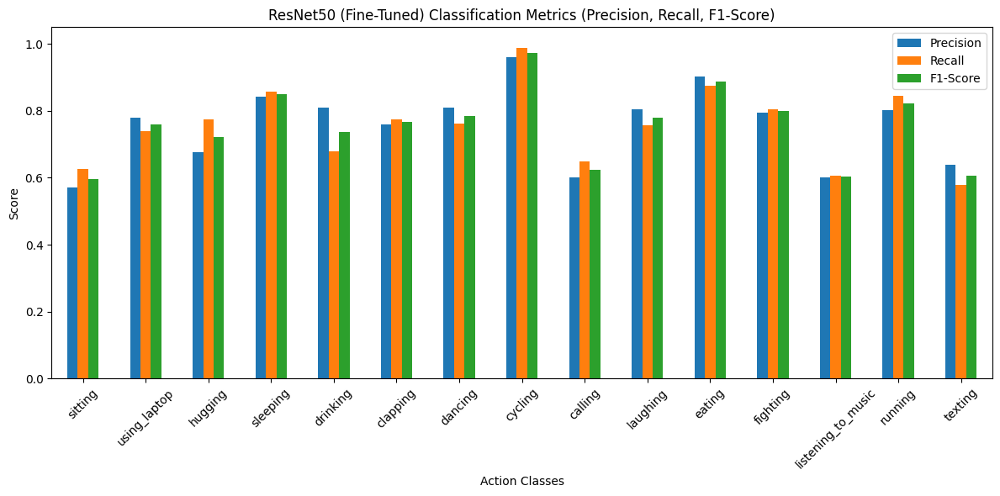

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report

# Define class names
target_classes = [
    "sitting", "using_laptop", "hugging", "sleeping", "drinking",
    "clapping", "dancing", "cycling", "calling", "laughing",
    "eating", "fighting", "listening_to_music", "running", "texting"
]

# Generate classification report using ResNet50 predictions
report = classification_report(
    y_true_classes_resnet,
    y_pred_classes_resnet,
    target_names=target_classes,
    output_dict=True
)

# Extract precision, recall, and F1-score per class
precision = [report[cls]["precision"] for cls in target_classes]
recall = [report[cls]["recall"] for cls in target_classes]
f1 = [report[cls]["f1-score"] for cls in target_classes]

# Create DataFrame for plotting
metrics = np.array([precision, recall, f1]).T
metrics_df = pd.DataFrame(metrics, columns=["Precision", "Recall", "F1-Score"], index=target_classes)

# Plotting the grouped bar chart
metrics_df.plot(kind='bar', figsize=(12, 6))
plt.title("ResNet50 (Fine-Tuned) Classification Metrics (Precision, Recall, F1-Score)")
plt.ylabel("Score")
plt.xlabel("Action Classes")
plt.xticks(rotation=45)
plt.ylim(0, 1.05)
plt.legend(loc='upper right')
plt.tight_layout()
plt.show()


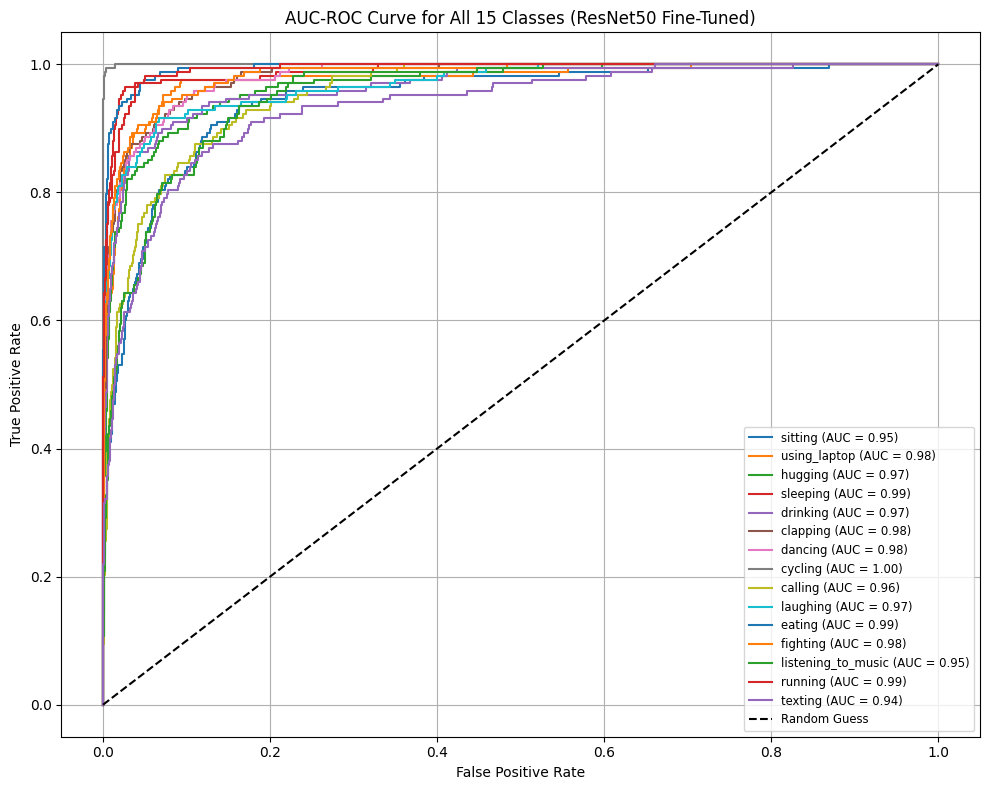

In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# AUC-ROC for each class
plt.figure(figsize=(10, 8))

for i in range(y_val.shape[1]):
    fpr, tpr, _ = roc_curve(y_val[:, i], y_pred_probs_resnet[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f"{class_names[i]} (AUC = {roc_auc:.2f})")

# Diagonal line (random performance)
plt.plot([0, 1], [0, 1], 'k--', label="Random Guess")

# Plot formatting
plt.title("AUC-ROC Curve for All 15 Classes (ResNet50 Fine-Tuned)")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend(loc="lower right", fontsize='small')
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
#Save Resnet50
model_Resnet.save_weights("/content/drive/MyDrive/HAR_MODEL_SAVE/Resnet50_finetuned.weights.h5")


In [ ]:
#venila CNN bulding from scratch
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import (Input, Conv2D, MaxPooling2D, Flatten, Dense,
                                     Dropout, BatchNormalization, RandomFlip, RandomRotation)
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Set seed
tf.random.set_seed(42)

# Constants
img_height, img_width = 224, 224
batch_size = 16
epochs = 15
AUTOTUNE = tf.data.AUTOTUNE

# Data Augmentation
data_augmentation = tf.keras.Sequential([
    RandomFlip("horizontal"),
    RandomRotation(0.1),
])

# Preprocessing function
def preprocess(image, label):
    image = tf.image.resize(image, [img_height, img_width])
    image = tf.cast(image, tf.float32) / 255.0
    return image, label

# Datasets
train_dataset = tf.data.Dataset.from_tensor_slices((X_train, y_train))
val_dataset = tf.data.Dataset.from_tensor_slices((X_val, y_val))

train_dataset = train_dataset.map(preprocess).shuffle(1000).batch(batch_size).prefetch(AUTOTUNE)
val_dataset = val_dataset.map(preprocess).batch(batch_size).prefetch(AUTOTUNE)

# CNN Model
input_layer = Input(shape=(img_height, img_width, 3))
x = data_augmentation(input_layer)

x = Conv2D(32, (3, 3), activation='relu', padding='same')(x)
x = BatchNormalization()(x)
x = MaxPooling2D((2, 2))(x)

x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
x = BatchNormalization()(x)
x = MaxPooling2D((2, 2))(x)

x = Conv2D(128, (3, 3), activation='relu', padding='same')(x)
x = BatchNormalization()(x)
x = MaxPooling2D((2, 2))(x)

x = Conv2D(256, (3, 3), activation='relu', padding='same')(x)
x = BatchNormalization()(x)
x = MaxPooling2D((2, 2))(x)

x = Flatten()(x)
x = Dense(512, activation='relu')(x)
x = Dropout(0.5)(x)
output_layer = Dense(y_train.shape[1], activation='softmax')(x)

model_cnn= Model(inputs=input_layer, outputs=output_layer)

model_cnn.compile(optimizer=Adam(learning_rate=0.0001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Train model
history = model_cnn.fit(train_dataset, validation_data=val_dataset, epochs=epochs, verbose=1)

# Evaluate
y_pred_probs = model_cnn.predict(val_dataset)
y_pred_classes = np.argmax(y_pred_probs, axis=1)
y_true_classes = np.argmax(y_val, axis=1)

accuracy = accuracy_score(y_true_classes, y_pred_classes)
precision = precision_score(y_true_classes, y_pred_classes, average='weighted')
recall = recall_score(y_true_classes, y_pred_classes, average='weighted')
f1 = f1_score(y_true_classes, y_pred_classes, average='weighted')

print(f" Vanilla CNN Performance:")
print(f"Accuracy  : {accuracy:.4f}")
print(f"Precision : {precision:.4f}")
print(f"Recall    : {recall:.4f}")
print(f"F1 Score  : {f1:.4f}")




Epoch 1/15
630/630 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step - accuracy: 0.1112 - loss: 3.5233 - val_accuracy: 0.1683 - val_loss: 2.5409
Epoch 2/15
630/630 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - accuracy: 0.1335 - loss: 2.6080 - val_accuracy: 0.1611 - val_loss: 2.5344
Epoch 3/15
630/630 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - accuracy: 0.1429 - loss: 2.5641 - val_accuracy: 0.1587 - val_loss: 2.5180
Epoch 4/15
630/630 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - accuracy: 0.1479 - loss: 2.5470 - val_accuracy: 0.1865 - val_loss: 2.4189
Epoch 5/15
630/630 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - accuracy: 0.1534 - loss: 2.5371 - val_accuracy: 0.2310 - val_loss: 2.3482
Epoch 6/15
630/630 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - accuracy: 0.1705 - loss: 2.4818 - val_accuracy: 0.2179 - val_loss: 2.4034
Epoch 7/15
630/630 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - accuracy: 0.1806 - loss: 2.4658 - val_accuracy: 0.2405 - val_loss: 2.3089
Epoch 8/15
630/630 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - accuracy: 0.1907 - loss: 2.4234 - 

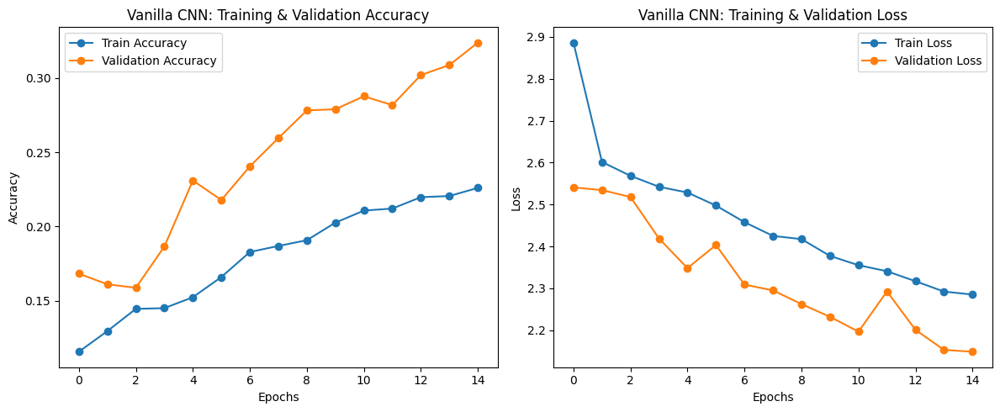

In [ ]:
# Plot Training & Validation Accuracy and Loss for Vanilla CNN
plt.figure(figsize=(12, 5))

# Accuracy Plot
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy', marker='o')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy', marker='o')
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.title("Vanilla CNN: Training & Validation Accuracy")
plt.legend()

# Loss Plot
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss', marker='o')
plt.plot(history.history['val_loss'], label='Validation Loss', marker='o')
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Vanilla CNN: Training & Validation Loss")
plt.legend()

plt.tight_layout()
plt.show()


In [ ]:
# Recompile the model with a lower learning rate for fine-tuning
model_cnn.compile(
    optimizer=Adam(learning_rate=1e-5),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Continue training (fine-tuning) for more epochs
fine_tune_history = model_cnn.fit(
    train_dataset,
    validation_data=val_dataset,
    epochs=10,
    verbose=1
)


Epoch 1/10
630/630 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - accuracy: 0.2436 - loss: 2.2466 - val_accuracy: 0.3393 - val_loss: 2.0856
Epoch 2/10
630/630 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - accuracy: 0.2512 - loss: 2.1978 - val_accuracy: 0.3373 - val_loss: 2.0734
Epoch 3/10
630/630 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - accuracy: 0.2667 - loss: 2.1770 - val_accuracy: 0.3452 - val_loss: 2.0614
Epoch 4/10
630/630 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - accuracy: 0.2587 - loss: 2.1864 - val_accuracy: 0.3488 - val_loss: 2.0599
Epoch 5/10
630/630 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - accuracy: 0.2591 - loss: 2.1762 - val_accuracy: 0.3567 - val_loss: 2.0587
Epoch 6/10
630/630 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - accuracy: 0.2697 - loss: 2.1434 - val_accuracy: 0.3520 - val_loss: 2.0578
Epoch 7/10
630/630 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - accuracy: 0.2663 - loss: 2.1615 - val_accuracy: 0.3575 - val_loss: 2.0398
Epoch 8/10
630/630 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step - accuracy: 0.2682 - loss: 2.1432 - 

158/158 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step
Vanilla CNN (Fine-Tuned) Accuracy and Classification Report:

Accuracy  : 0.3556
              precision    recall  f1-score   support

           0       0.21      0.20      0.20       168
           1       0.29      0.55      0.38       168
           2       0.21      0.17      0.19       168
           3       0.51      0.36      0.42       168
           4       0.18      0.05      0.08       168
           5       0.25      0.21      0.23       168
           6       0.41      0.56      0.47       168
           7       0.56      0.77      0.65       168
           8       0.18      0.08      0.11       168
           9       0.30      0.50      0.37       168
          10       0.51      0.65      0.57       168
          11       0.42      0.57      0.48       168
          12       0.21      0.23      0.22       168
          13       0.49      0.41      0.45       168
          14       0.33      0.02      0.04       168

    accuracy

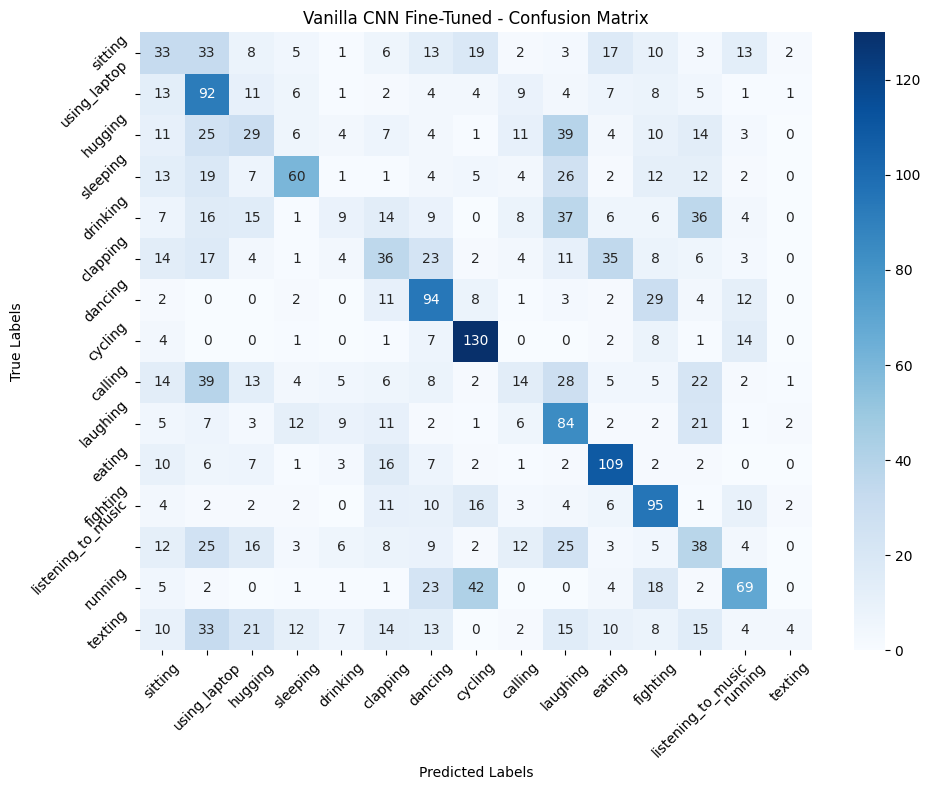

In [ ]:
# Predict Vanilla Finetuning accuracy
y_pred_probs_cnn = model_cnn.predict(val_dataset)
y_pred_classes_cnn = np.argmax(y_pred_probs_cnn, axis=1)
y_true_classes_cnn = np.argmax(y_val, axis=1)  #  y_val is one-hot encoded

# Compute evaluation metrics
accuracy = accuracy_score(y_true_classes_cnn, y_pred_classes_cnn)
precision = precision_score(y_true_classes_cnn, y_pred_classes_cnn, average='weighted')
recall = recall_score(y_true_classes_cnn, y_pred_classes_cnn, average='weighted')
f1 = f1_score(y_true_classes_cnn, y_pred_classes_cnn, average='weighted')

#  Print evaluation summary
print("Vanilla CNN (Fine-Tuned) Accuracy and Classification Report:\n")
print(f"Accuracy  : {accuracy:.4f}")

print(classification_report(y_true_classes_cnn, y_pred_classes_cnn, digits=2))

#  Confusion Matrix
class_names = [
    "sitting", "using_laptop", "hugging", "sleeping", "drinking",
    "clapping", "dancing", "cycling", "calling", "laughing",
    "eating", "fighting", "listening_to_music", "running", "texting"
]

conf_matrix = confusion_matrix(y_true_classes_cnn, y_pred_classes_cnn)

plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names)
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Vanilla CNN Fine-Tuned - Confusion Matrix")
plt.xticks(rotation=45)
plt.yticks(rotation=45)
plt.tight_layout()
plt.show()



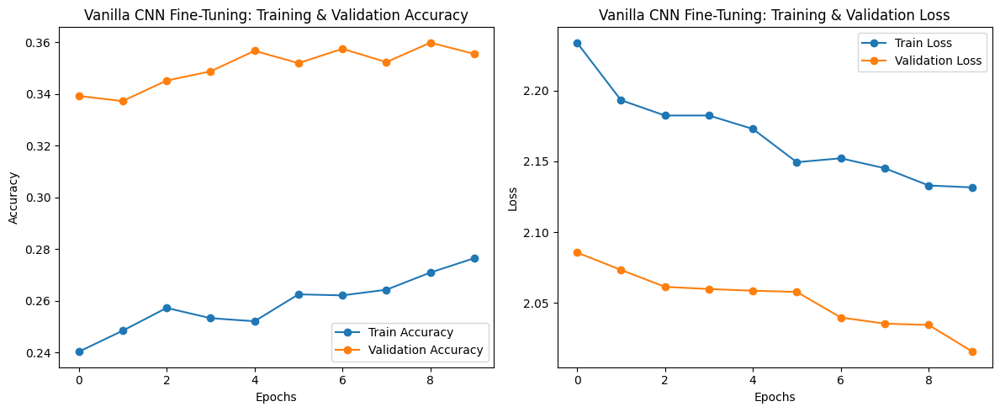

In [ ]:
# Plot Train & Validation Accuracy and Loss (Fine-Tune Phase)
plt.figure(figsize=(12, 5))

# Accuracy plot
plt.subplot(1, 2, 1)
plt.plot(fine_tune_history.history['accuracy'], label='Train Accuracy', marker='o')
plt.plot(fine_tune_history.history['val_accuracy'], label='Validation Accuracy', marker='o')
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.title("Vanilla CNN Fine-Tuning: Training & Validation Accuracy")
plt.legend()

# Loss plot
plt.subplot(1, 2, 2)
plt.plot(fine_tune_history.history['loss'], label='Train Loss', marker='o')
plt.plot(fine_tune_history.history['val_loss'], label='Validation Loss', marker='o')
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Vanilla CNN Fine-Tuning: Training & Validation Loss")
plt.legend()

plt.tight_layout()
plt.show()


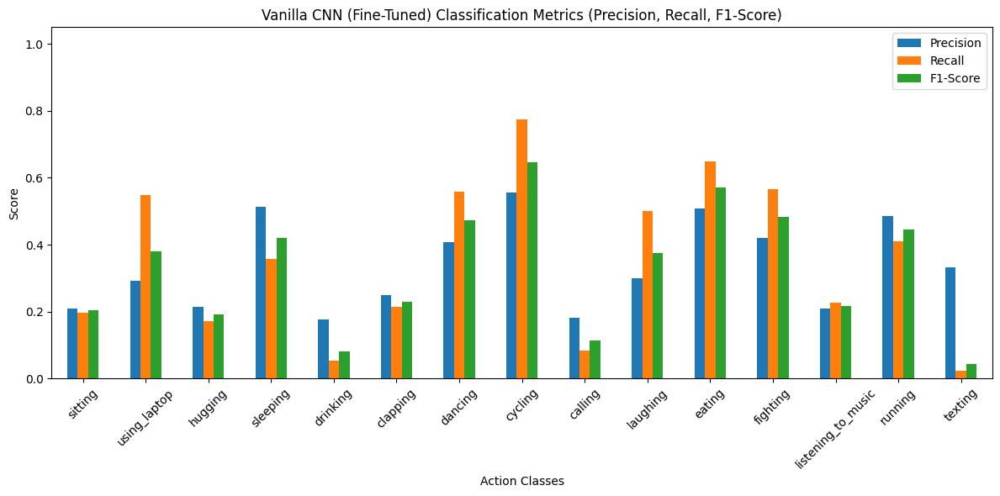

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report

# Define class names (same as one-hot encoding order)
target_classes = [
    "sitting", "using_laptop", "hugging", "sleeping", "drinking",
    "clapping", "dancing", "cycling", "calling", "laughing",
    "eating", "fighting", "listening_to_music", "running", "texting"
]

# Generate classification report
report = classification_report(
    y_true_classes_cnn,
    y_pred_classes_cnn,
    target_names=target_classes,
    output_dict=True
)

# Extract class-wise metrics
precision = [report[cls]["precision"] for cls in target_classes]
recall = [report[cls]["recall"] for cls in target_classes]
f1 = [report[cls]["f1-score"] for cls in target_classes]

# Prepare DataFrame
metrics = np.array([precision, recall, f1]).T
metrics_df = pd.DataFrame(metrics, columns=["Precision", "Recall", "F1-Score"], index=target_classes)

# Plot the grouped bar chart
metrics_df.plot(kind='bar', figsize=(12, 6))
plt.title("Vanilla CNN (Fine-Tuned) Classification Metrics (Precision, Recall, F1-Score)")
plt.ylabel("Score")
plt.xlabel("Action Classes")
plt.xticks(rotation=45)
plt.ylim(0, 1.05)
plt.legend(loc='upper right')
plt.tight_layout()
plt.show()


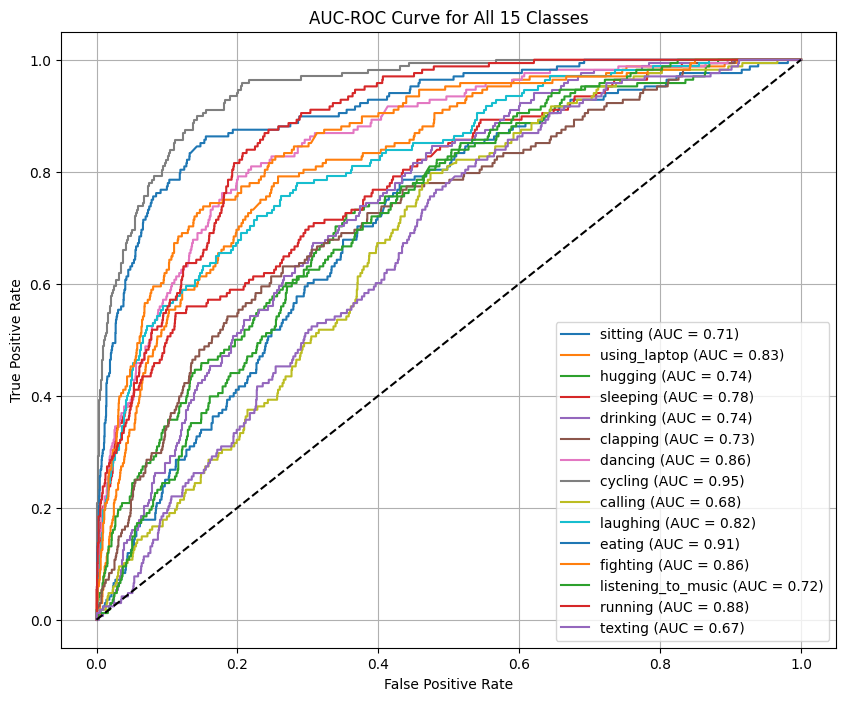

In [ ]:
# finding AOC-ROC for 15 classes to see limitation of each class
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 8))
for i in range(y_val.shape[1]):
    fpr, tpr, _ = roc_curve(y_val[:, i], y_pred_probs[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f"{class_names[i]} (AUC = {roc_auc:.2f})")

plt.plot([0, 1], [0, 1], 'k--')
plt.title("AUC-ROC Curve for All 15 Classes")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend()
plt.grid(True)
plt.show()


In [ ]:
#Save venila CNN
model_cnn.save_weights("/content/drive/MyDrive/HAR_MODEL_SAVE/VenilaCNN_finetuned.weights.h5")


## **Model Evalution**

In [ ]:
#VIT model evalution from test data pick random images
import random
import matplotlib.pyplot as plt
import numpy as np

def test_random_vit(X_val, y_val, class_names, model_vit, feature_extractor, num_samples=5):
    for _ in range(num_samples):
        idx = random.randint(0, len(X_val) - 1)
        image = X_val[idx]
        true_label = np.argmax(y_val[idx])

        # ViT preprocessing
        processed = feature_extractor(image, return_tensors="np")["pixel_values"]

        # Prediction
        pred = model_vit.predict(processed, verbose=0)
        pred_label = np.argmax(pred)

        # Display result
        plt.imshow(image.astype("uint8"))
        plt.axis('off')
        plt.title(f"True: {class_names[true_label]}\nPredicted: {class_names[pred_label]}")
        plt.show()


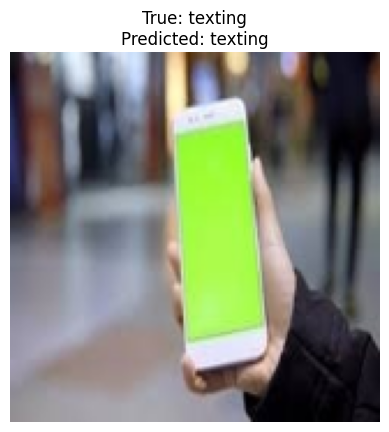

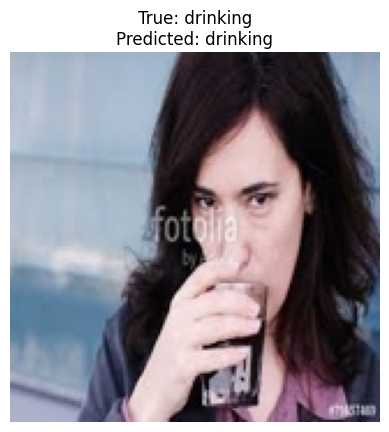

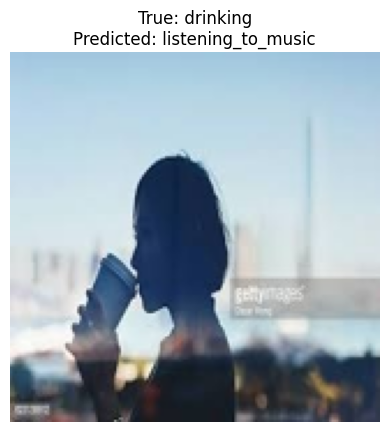

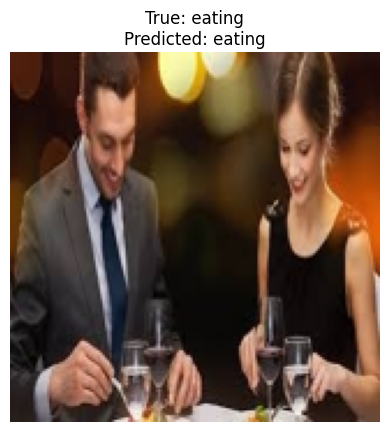

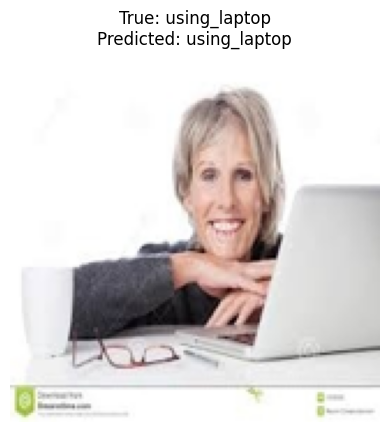

...

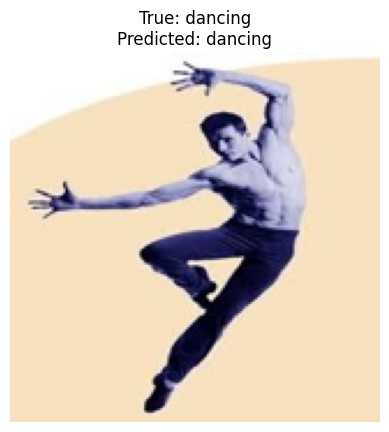

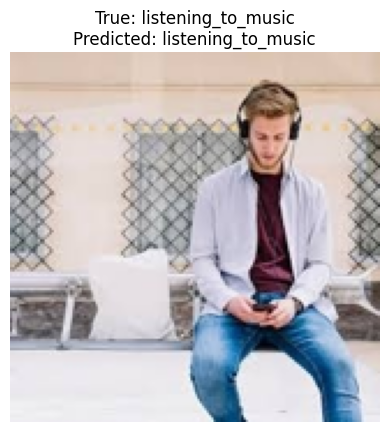

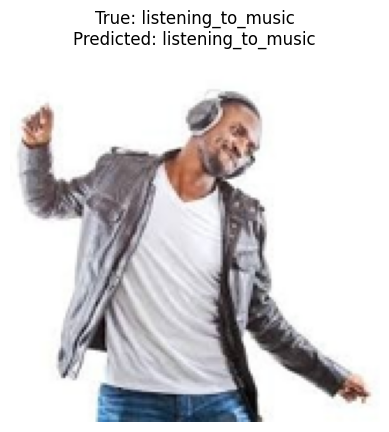

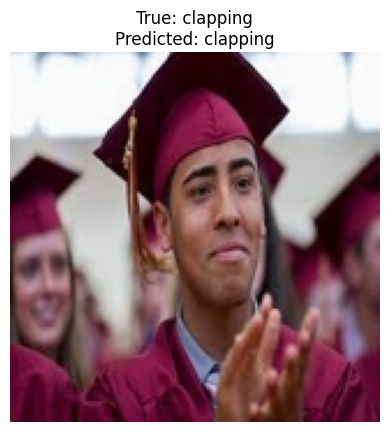

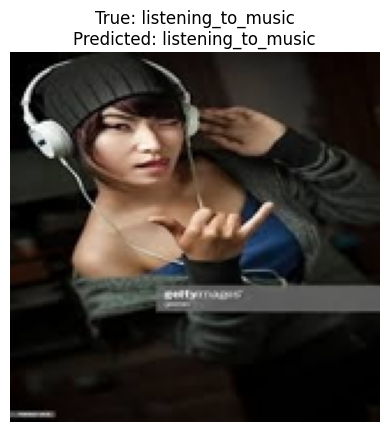

In [ ]:
#Testing Vit model with random sample 15 images
test_random_vit(
    X_val=X_val,
    y_val=y_val,
    class_names=class_names,
    model_vit=model_vit,
    feature_extractor=feature_extractor,
    num_samples=15
)


In [ ]:
#Mobilenet v2 model evalution from test data pick random images
import random
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input

def test_random_mobilenet(X_val, y_val, class_names, model_mobilenet, num_samples=5):
    for _ in range(num_samples):
        idx = random.randint(0, len(X_val) - 1)
        image = X_val[idx]
        true_label = np.argmax(y_val[idx])

        # Preprocessing for MobileNetV2
        resized = tf.image.resize(image, (224, 224))
        mobilenet_input = preprocess_input(resized.numpy())
        mobilenet_input = tf.expand_dims(mobilenet_input, axis=0)

        # Prediction
        pred = model_mobilenet.predict(mobilenet_input, verbose=0)
        pred_label = np.argmax(pred)

        # Display result
        plt.imshow(image.astype("uint8"))
        plt.axis('off')
        plt.title(f"True: {class_names[true_label]}\nPredicted: {class_names[pred_label]}")
        plt.show()


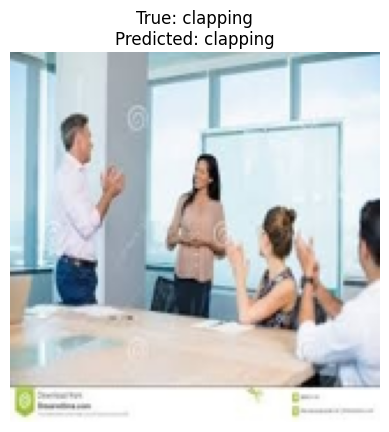

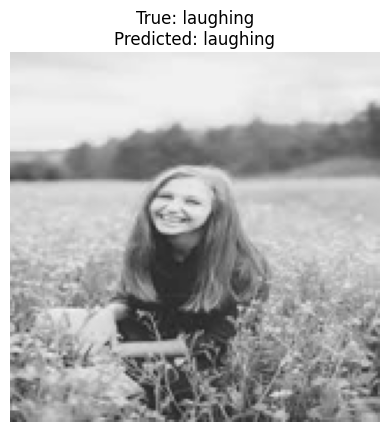

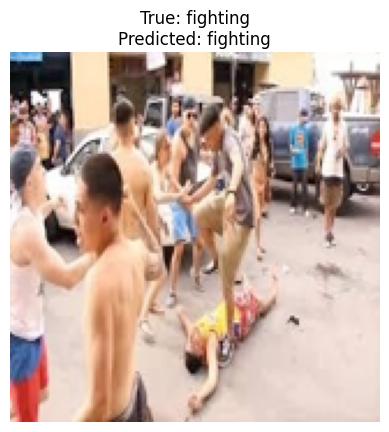

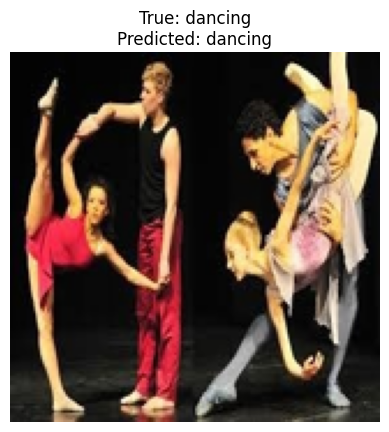

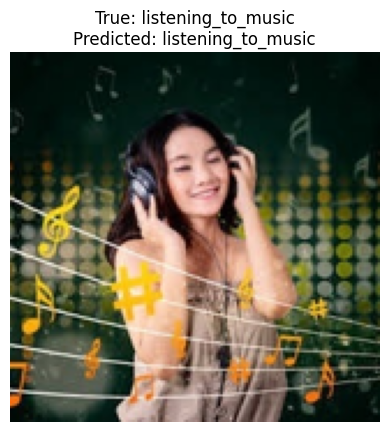

...

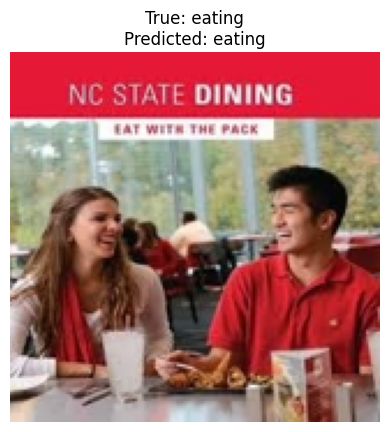

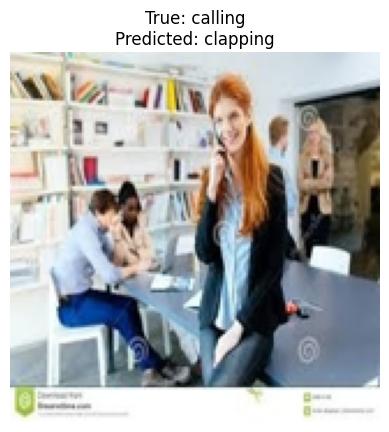

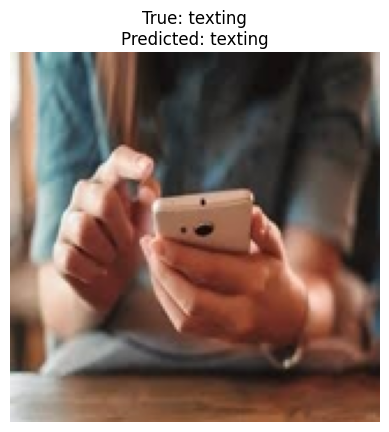

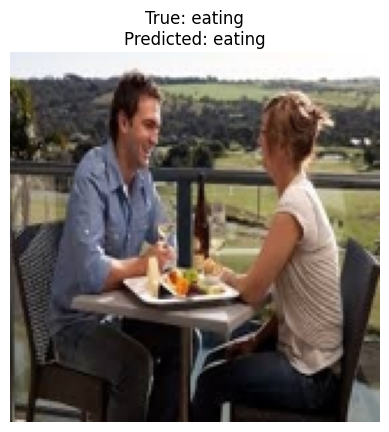

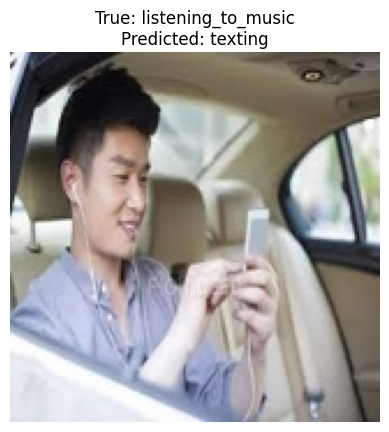

In [ ]:
test_random_mobilenet(
    X_val=X_val,
    y_val=y_val,
    class_names=class_names,
    model_mobilenet=model_mobilenet,
    num_samples=15
)


In [ ]:
#Resnet50 model evalution from test data pick random images
import random
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications.resnet50 import preprocess_input

def test_random_resnet(X_val, y_val, class_names, model_Resnet, num_samples=5):
    for _ in range(num_samples):
        idx = random.randint(0, len(X_val) - 1)
        image = X_val[idx]
        true_label = np.argmax(y_val[idx])

        # ResNet50 preprocessing
        resized = tf.image.resize(image, (224, 224))
        resnet_input = preprocess_input(resized.numpy())
        resnet_input = tf.expand_dims(resnet_input, axis=0)

        # Prediction
        pred = model_Resnet.predict(resnet_input, verbose=0)
        pred_label = np.argmax(pred)

        # Display result
        plt.imshow(image.astype("uint8"))
        plt.axis('off')
        plt.title(f"True: {class_names[true_label]}\nPredicted: {class_names[pred_label]}")
        plt.show()


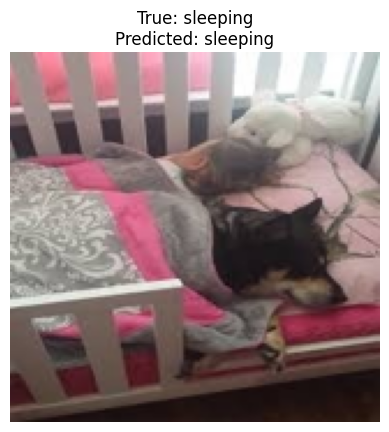

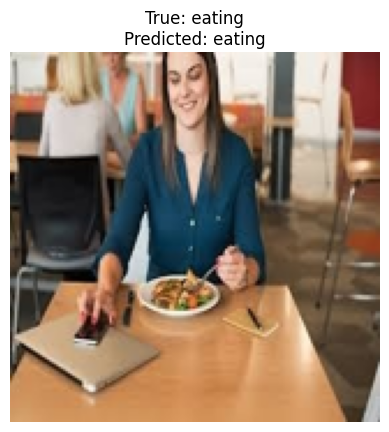

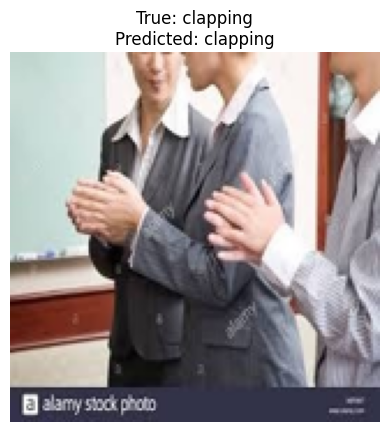

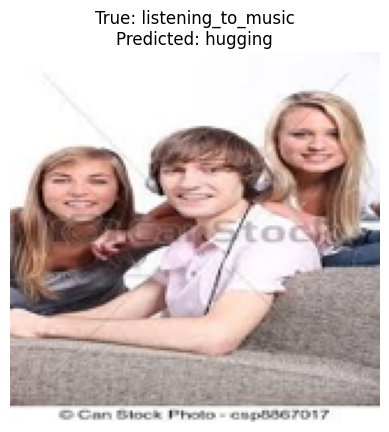

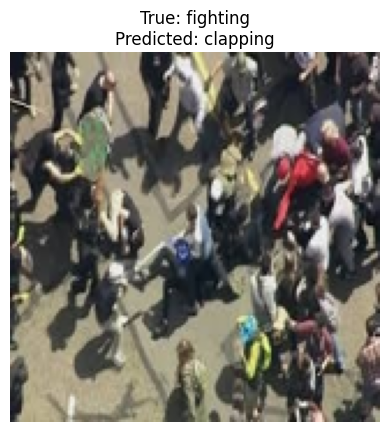

...

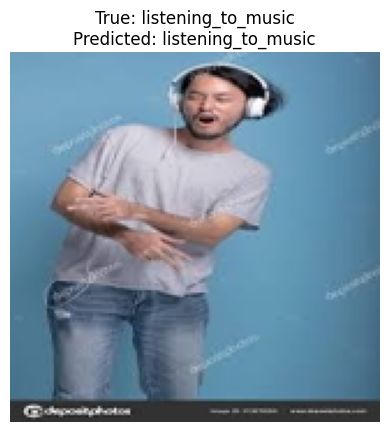

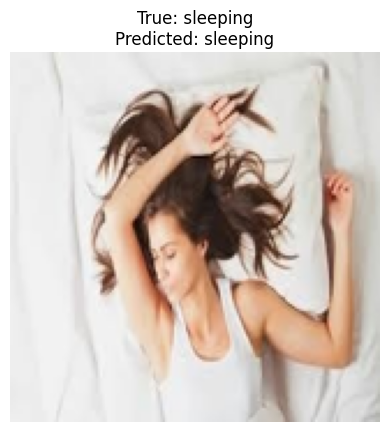

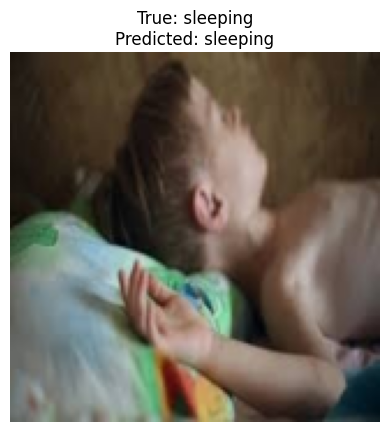

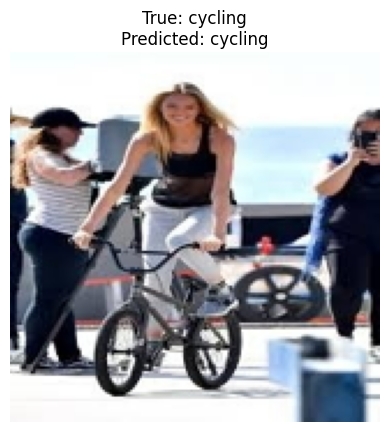

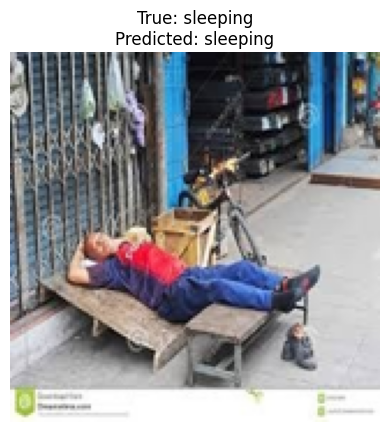

In [ ]:
test_random_resnet(
    X_val=X_val,
    y_val=y_val,
    class_names=class_names,
    model_Resnet=model_Resnet,
    num_samples=15
)


In [ ]:
#Vanilla CNN model evalution from test data pick random images
import random
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf

def test_random_cnn(X_val, y_val, class_names, model_cnn, num_samples=5):
    for _ in range(num_samples):
        idx = random.randint(0, len(X_val) - 1)
        image = X_val[idx]
        true_label = np.argmax(y_val[idx])

        # Preprocessing for Vanilla CNN
        resized = tf.image.resize(image, (224, 224))
        cnn_input = tf.cast(resized, tf.float32) / 255.0
        cnn_input = tf.expand_dims(cnn_input, axis=0)

        # Prediction
        pred = model_cnn.predict(cnn_input, verbose=0)
        pred_label = np.argmax(pred)

        # Display result
        plt.imshow(image.astype("uint8"))
        plt.axis('off')
        plt.title(f"True: {class_names[true_label]}\nPredicted: {class_names[pred_label]}")
        plt.show()


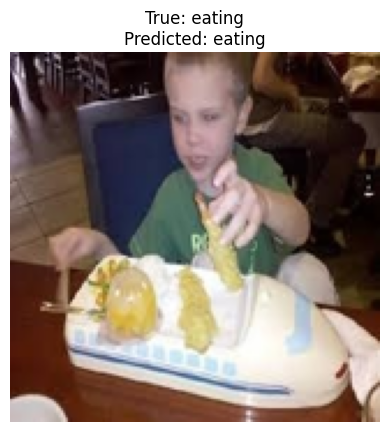

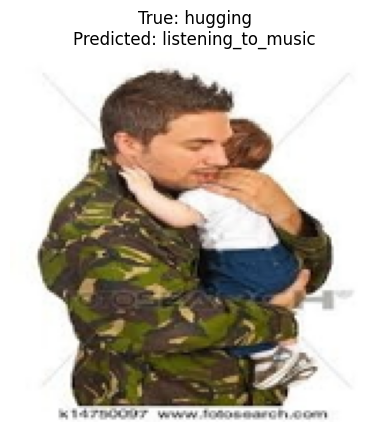

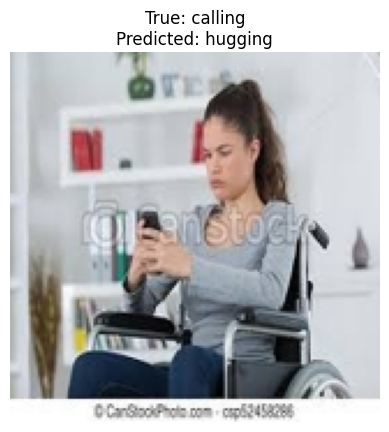

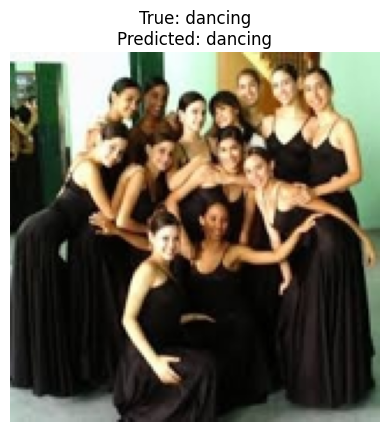

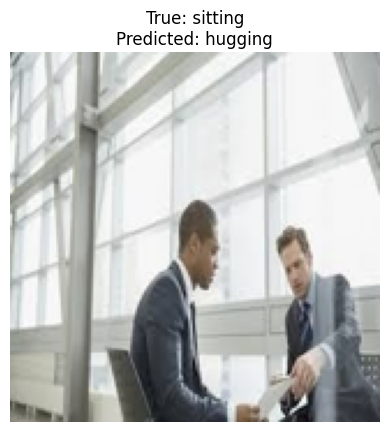

...

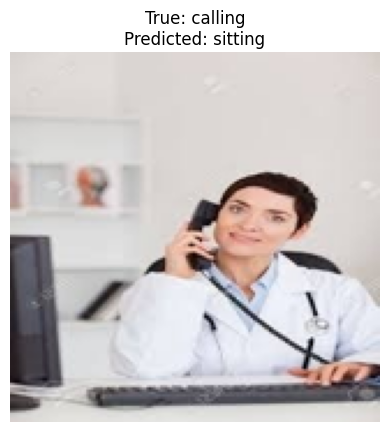

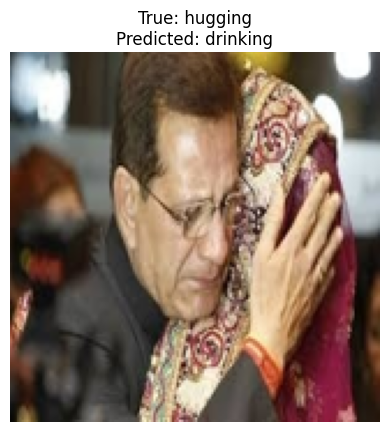

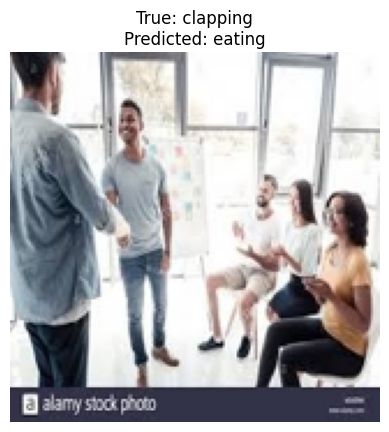

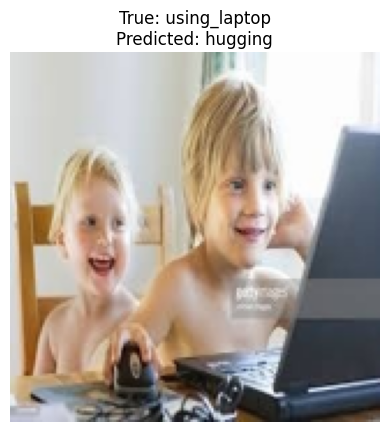

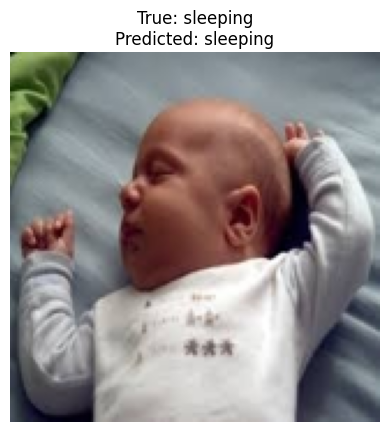

In [ ]:
test_random_cnn(
    X_val=X_val,
    y_val=y_val,
    class_names=class_names,
    model_cnn=model_cnn,
    num_samples=15
)


## **Model Performance Comparision**

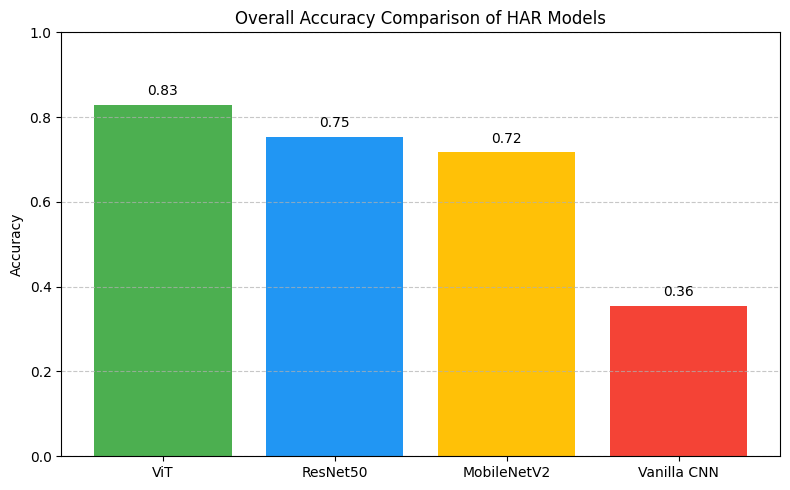

In [ ]:
import matplotlib.pyplot as plt

# Automatically gathered model accuracies
model_accuracies = {
    "ViT": accuracy_score(y_true_classes_vit, y_pred_classes_vit),
    "ResNet50": accuracy_score(y_true_classes_resnet, y_pred_classes_resnet),
    "MobileNetV2": accuracy_score(y_true_classes_finetuned, y_pred_classes_finetuned),
    "Vanilla CNN": accuracy_score(y_true_classes_cnn, y_pred_classes_cnn),
}

# Plotting
plt.figure(figsize=(8, 5))
bars = plt.bar(model_accuracies.keys(), model_accuracies.values(),
               color=["#4CAF50", "#2196F3", "#FFC107", "#F44336"])
plt.ylim(0, 1)
plt.title("Overall Accuracy Comparison of HAR Models")
plt.ylabel("Accuracy")

# Annotate bars
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, height + 0.015, f"{height:.2f}", ha='center', va='bottom')

plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()
